In [5]:
!pip install pytrends

In [1]:
#!/usr/bin/env python
# coding: utf-8

from datetime import datetime, timedelta, date, time
import pandas as pd
import time
import matplotlib.pyplot as plt

from pytrends.request import TrendReq
from pytrends.exceptions import ResponseError


def _fetch_data(trendreq, kw_list, timeframe='today 3-m', cat=0, geo='', gprop='') -> pd.DataFrame:
    
    """Download google trends data using pytrends TrendReq and retries in case of a ResponseError."""
    attempts, fetched = 0, False
    while not fetched:
        try:
            trendreq.build_payload(kw_list=kw_list, timeframe=timeframe, cat=cat, geo=geo, gprop=gprop)
        except ResponseError as err:
            print(err)
            print(f'Trying again in {60 + 5 * attempts} seconds.')
            sleep(60 + 5 * attempts)
            attempts += 1
            if attempts > 3:
                print('Failed after 3 attemps, abort fetching.')
                break
        else:
            fetched = True
    return trendreq.interest_over_time()

def get_daily_trend(trendreq, keyword:str, start:str, end:str, cat=0, 
                    geo='', gprop='', delta=269, overlap=100, sleep=0, 
                    tz=0, verbose=False) ->pd.DataFrame:

    """Stich and scale consecutive daily trends data between start and end date.
    This function will first download piece-wise google trends data and then 
    scale each piece using the overlapped period. 
        Parameters
        ----------
        trendreq : TrendReq
            a pytrends TrendReq object
        keyword: str
            currently only support single keyword, without bracket
        start: str
            starting date in string format:YYYY-MM-DD (e.g.2017-02-19)
        end: str
            ending date in string format:YYYY-MM-DD (e.g.2017-02-19)
        cat, geo, gprop, sleep: 
            same as defined in pytrends
        delta: int
            The length(days) of each timeframe fragment for fetching google trends data, 
            need to be <269 in order to obtain daily data.
        overlap: int
            The length(days) of the overlap period used for scaling/normalization
        tz: int
            The timezone shift in minute relative to the UTC+0 (google trends default).
            For example, correcting for UTC+8 is 480, and UTC-6 is -360 
    """
    
    start_d = datetime.datetime.strptime(start, '%Y-%m-%d')
    init_end_d = end_d = datetime.datetime.strptime(end, '%Y-%m-%d')
    init_end_d.replace(hour=23, minute=59, second=59)    
    delta = timedelta(days=delta)
    overlap = timedelta(days=overlap)

    itr_d = end_d - delta
    overlap_start = None

    df = pd.DataFrame()
    ol = pd.DataFrame()
    
    while end_d > start_d:
        tf = itr_d.strftime('%Y-%m-%d')+' '+end_d.strftime('%Y-%m-%d')
        if verbose: print('Fetching \''+keyword+'\' for period:'+tf)
        temp = _fetch_data(trendreq, [keyword], timeframe=tf, cat=cat, geo=geo, gprop=gprop)
        temp.drop(columns=['isPartial'], inplace=True)
        temp.columns.values[0] = tf
        ol_temp = temp.copy()
        ol_temp.iloc[:,:] = None
        if overlap_start is not None:  # not first iteration
            if verbose: print('Normalize by overlapping period:'+overlap_start.strftime('%Y-%m-%d'), end_d.strftime('%Y-%m-%d'))
            #normalize using the maximum value of the overlapped period
            y1 = temp.loc[overlap_start:end_d].iloc[:,0].values.max()
            y2 = df.loc[overlap_start:end_d].iloc[:,-1].values.max()
            coef = y2/y1
            temp = temp * coef
            ol_temp.loc[overlap_start:end_d, :] = 1 

        df = pd.concat([df,temp], axis=1)
        ol = pd.concat([ol, ol_temp], axis=1)
        # shift the timeframe for next iteration
        overlap_start = itr_d
        end_d -= (delta-overlap)
        itr_d -= (delta-overlap)
        # in case of short query interval getting banned by server
        time.sleep(sleep)
    
    df.sort_index(inplace=True)
    ol.sort_index(inplace=True)
    #The daily trend data is missing the most recent 3-days data, need to complete with hourly data
    if df.index.max() < init_end_d : 
        tf = 'now 7-d'
        hourly = _fetch_data(trendreq, [keyword], timeframe=tf, cat=cat, geo=geo, gprop=gprop)
        hourly.drop(columns=['isPartial'], inplace=True)
        
        #convert hourly data to daily data
        daily = hourly.groupby(hourly.index.date).sum()
        
        #check whether the first day data is complete (i.e. has 24 hours)
        daily['hours'] = hourly.groupby(hourly.index.date).count()
        if daily.iloc[0].loc['hours'] != 24: daily.drop(daily.index[0], inplace=True)
        daily.drop(columns='hours', inplace=True)
        
        daily.set_index(pd.DatetimeIndex(daily.index), inplace=True)
        daily.columns = [tf]
        
        ol_temp = daily.copy()
        ol_temp.iloc[:,:] = None
        # find the overlapping date
        intersect = df.index.intersection(daily.index)
        if verbose: print('Normalize by overlapping period:'+(intersect.min().strftime('%Y-%m-%d'))+' '+(intersect.max().strftime('%Y-%m-%d')))
        # scaling use the overlapped today-4 to today-7 data
        coef = df.loc[intersect].iloc[:,0].max() / daily.loc[intersect].iloc[:,0].max()
        daily = (daily*coef).round(decimals=0)
        ol_temp.loc[intersect,:] = 1
        
        df = pd.concat([daily, df], axis=1)
        ol = pd.concat([ol_temp, ol], axis=1)

    # taking averages for overlapped period
    df = df.mean(axis=1)
    ol = ol.max(axis=1)
    # merge the two dataframe (trend data and overlap flag)
    df = pd.concat([df,ol], axis=1)
    df.columns = [keyword,'overlap']
    # Correct the timezone difference
    df.index = df.index + timedelta(minutes=tz)
    df = df[start_d:init_end_d]
    # re-normalized to the overall maximum value to have max =100
    df[keyword] = (100*df[keyword]/df[keyword].max()).round(decimals=0)
    
    return df

2020-10-06
2020-10-07


<ipython-input-2-37bc3569ad6b>:18: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
  hoja = docs.get_sheet_by_name("lista")
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readth

            mercado libre  overlap
date                              
2018-01-01           40.0      NaN
2018-01-02           58.0      NaN
2018-01-03           56.0      NaN
2018-01-04           61.0      NaN
2018-01-05           57.0      NaN
...                   ...      ...
2020-08-24           46.0      NaN
2020-08-25           47.0      NaN
2020-08-26           48.0      NaN
2020-08-27           45.0      NaN
2020-08-28           48.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            celular  overlap
date                        
2018-01-01     71.0      NaN
2018-01-02     66.0      NaN
2018-01-03     64.0      NaN
2018-01-04     71.0      NaN
2018-01-05     63.0      NaN
...             ...      ...
2020-08-24     73.0      NaN
2020-08-25     76.0      NaN
2020-08-26     72.0      NaN
2020-08-27     75.0      NaN
2020-08-28     74.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            xiaomi  overlap
date                       
2018-01-01     6.0      NaN
2018-01-02     7.0      NaN
2018-01-03     7.0      NaN
2018-01-04     7.0      NaN
2018-01-05     6.0      NaN
...            ...      ...
2020-08-24    40.0      NaN
2020-08-25    32.0      NaN
2020-08-26    37.0      NaN
2020-08-27    36.0      NaN
2020-08-28    35.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            dafiti  overlap
date                       
2018-01-01    14.0      NaN
2018-01-02    23.0      NaN
2018-01-03    19.0      NaN
2018-01-04    23.0      NaN
2018-01-05    20.0      NaN
...            ...      ...
2020-08-24    19.0      NaN
2020-08-25    17.0      NaN
2020-08-26    20.0      NaN
2020-08-27    19.0      NaN
2020-08-28    21.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            tenis nike  overlap
date                           
2018-01-01        34.0      NaN
2018-01-02        29.0      NaN
2018-01-03        21.0      NaN
2018-01-04        19.0      NaN
2018-01-05        15.0      NaN
...                ...      ...
2020-08-24        23.0      NaN
2020-08-25        25.0      NaN
2020-08-26        23.0      NaN
2020-08-27        27.0      NaN
2020-08-28        38.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            televisor  overlap
date                          
2018-01-01       23.0      NaN
2018-01-02       10.0      NaN
2018-01-03       14.0      NaN
2018-01-04       10.0      NaN
2018-01-05       16.0      NaN
...               ...      ...
2020-08-24       24.0      NaN
2020-08-25       25.0      NaN
2020-08-26       30.0      NaN
2020-08-27       23.0      NaN
2020-08-28       26.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            nevera  overlap
date                       
2018-01-01     8.0      NaN
2018-01-02    25.0      NaN
2018-01-03    22.0      NaN
2018-01-04    36.0      NaN
2018-01-05    36.0      NaN
...            ...      ...
2020-08-24    38.0      NaN
2020-08-25    33.0      NaN
2020-08-26    28.0      NaN
2020-08-27    31.0      NaN
2020-08-28    31.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            lavadora  overlap
date                         
2018-01-01      14.0      NaN
2018-01-02      23.0      NaN
2018-01-03      22.0      NaN
2018-01-04      23.0      NaN
2018-01-05      17.0      NaN
...              ...      ...
2020-08-24      26.0      NaN
2020-08-25      29.0      NaN
2020-08-26      36.0      NaN
2020-08-27      24.0      NaN
2020-08-28      29.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            falabella  overlap
date                          
2018-01-01        5.0      NaN
2018-01-02        7.0      NaN
2018-01-03        7.0      NaN
2018-01-04        7.0      NaN
2018-01-05        7.0      NaN
...               ...      ...
2020-08-24        8.0      NaN
2020-08-25        8.0      NaN
2020-08-26        8.0      NaN
2020-08-27        8.0      NaN
2020-08-28        9.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            linio  overlap
date                      
2018-01-01    6.0      NaN
2018-01-02   21.0      NaN
2018-01-03   23.0      NaN
2018-01-04   15.0      NaN
2018-01-05   20.0      NaN
...           ...      ...
2020-08-24   10.0      NaN
2020-08-25   12.0      NaN
2020-08-26   11.0      NaN
2020-08-27   10.0      NaN
2020-08-28   10.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            rappi  overlap
date                      
2018-01-01    5.0      NaN
2018-01-02    6.0      NaN
2018-01-03    4.0      NaN
2018-01-04    5.0      NaN
2018-01-05    5.0      NaN
...           ...      ...
2020-08-24   25.0      NaN
2020-08-25   21.0      NaN
2020-08-26   20.0      NaN
2020-08-27   20.0      NaN
2020-08-28   31.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            tiquete  overlap
date                        
2018-01-01     62.0      NaN
2018-01-02     56.0      NaN
2018-01-03     80.0      NaN
2018-01-04     54.0      NaN
2018-01-05     70.0      NaN
...             ...      ...
2020-08-24     10.0      NaN
2020-08-25     12.0      NaN
2020-08-26     12.0      NaN
2020-08-27      7.0      NaN
2020-08-28      6.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            viva air  overlap
date                         
2018-01-01       0.0      NaN
2018-01-02       0.0      NaN
2018-01-03       2.0      NaN
2018-01-04       2.0      NaN
2018-01-05       0.0      NaN
...              ...      ...
2020-08-24      10.0      NaN
2020-08-25      15.0      NaN
2020-08-26      21.0      NaN
2020-08-27      18.0      NaN
2020-08-28      18.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            san andres  overlap
date                           
2018-01-01        71.0      NaN
2018-01-02        68.0      NaN
2018-01-03        89.0      NaN
2018-01-04       100.0      NaN
2018-01-05        72.0      NaN
...                ...      ...
2020-08-24        18.0      NaN
2020-08-25        22.0      NaN
2020-08-26        17.0      NaN
2020-08-27        26.0      NaN
2020-08-28        22.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            computador  overlap
date                           
2018-01-01        18.0      NaN
2018-01-02        34.0      NaN
2018-01-03        32.0      NaN
2018-01-04        34.0      NaN
2018-01-05        27.0      NaN
...                ...      ...
2020-08-24        55.0      NaN
2020-08-25        57.0      NaN
2020-08-26        65.0      NaN
2020-08-27        64.0      NaN
2020-08-28        60.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            alkosto  overlap
date                        
2018-01-01      2.0      NaN
2018-01-02      4.0      NaN
2018-01-03      4.0      NaN
2018-01-04      3.0      NaN
2018-01-05      3.0      NaN
...             ...      ...
2020-08-24      6.0      NaN
2020-08-25      6.0      NaN
2020-08-26      6.0      NaN
2020-08-27      5.0      NaN
2020-08-28      6.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            home center  overlap
date                            
2018-01-01         20.0      NaN
2018-01-02         15.0      NaN
2018-01-03         18.0      NaN
2018-01-04         15.0      NaN
2018-01-05         22.0      NaN
...                 ...      ...
2020-08-24         20.0      NaN
2020-08-25         21.0      NaN
2020-08-26         18.0      NaN
2020-08-27         21.0      NaN
2020-08-28         22.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            katronix  overlap
date                         
2018-01-01       2.0      NaN
2018-01-02       3.0      NaN
2018-01-03       2.0      NaN
2018-01-04       2.0      NaN
2018-01-05       2.0      NaN
...              ...      ...
2020-08-24       7.0      NaN
2020-08-25       6.0      NaN
2020-08-26       4.0      NaN
2020-08-27       2.0      NaN
2020-08-28       5.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            hotel  overlap
date                      
2018-01-01   52.0      NaN
2018-01-02   75.0      NaN
2018-01-03   77.0      NaN
2018-01-04   74.0      NaN
2018-01-05   78.0      NaN
...           ...      ...
2020-08-24   13.0      NaN
2020-08-25   14.0      NaN
2020-08-26   15.0      NaN
2020-08-27   16.0      NaN
2020-08-28   16.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            mabe  overlap
date                     
2018-01-01   4.0      NaN
2018-01-02   8.0      NaN
2018-01-03   7.0      NaN
2018-01-04   4.0      NaN
2018-01-05   5.0      NaN
...          ...      ...
2020-08-24  13.0      NaN
2020-08-25  16.0      NaN
2020-08-26  13.0      NaN
2020-08-27  11.0      NaN
2020-08-28  18.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            easy fly  overlap
date                         
2018-01-01      51.0      NaN
2018-01-02      32.0      NaN
2018-01-03      64.0      NaN
2018-01-04      21.0      NaN
2018-01-05      29.0      NaN
...              ...      ...
2020-08-24      18.0      NaN
2020-08-25      21.0      NaN
2020-08-26      10.0      NaN
2020-08-27      21.0      NaN
2020-08-28      19.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            muebles  overlap
date                        
2018-01-01     35.0      NaN
2018-01-02     54.0      NaN
2018-01-03     52.0      NaN
2018-01-04     63.0      NaN
2018-01-05     51.0      NaN
...             ...      ...
2020-08-24     54.0      NaN
2020-08-25     47.0      NaN
2020-08-26     51.0      NaN
2020-08-27     42.0      NaN
2020-08-28     43.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            domicilio  overlap
date                          
2018-01-01       23.0      NaN
2018-01-02       13.0      NaN
2018-01-03       15.0      NaN
2018-01-04       15.0      NaN
2018-01-05       12.0      NaN
...               ...      ...
2020-08-24       11.0      NaN
2020-08-25       10.0      NaN
2020-08-26       13.0      NaN
2020-08-27       15.0      NaN
2020-08-28       17.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            arturo calle  overlap
date                             
2018-01-01          10.0      NaN
2018-01-02           5.0      NaN
2018-01-03           6.0      NaN
2018-01-04           4.0      NaN
2018-01-05           6.0      NaN
...                  ...      ...
2020-08-24          15.0      NaN
2020-08-25           9.0      NaN
2020-08-26          10.0      NaN
2020-08-27          14.0      NaN
2020-08-28          14.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            wplay  overlap
date                      
2018-01-01    4.0      NaN
2018-01-02    7.0      NaN
2018-01-03    7.0      NaN
2018-01-04    7.0      NaN
2018-01-05    6.0      NaN
...           ...      ...
2020-08-24   27.0      NaN
2020-08-25   31.0      NaN
2020-08-26   34.0      NaN
2020-08-27   32.0      NaN
2020-08-28   28.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            jumbo  overlap
date                      
2018-01-01    6.0      NaN
2018-01-02    5.0      NaN
2018-01-03    5.0      NaN
2018-01-04    5.0      NaN
2018-01-05    7.0      NaN
...           ...      ...
2020-08-24    6.0      NaN
2020-08-25    5.0      NaN
2020-08-26    6.0      NaN
2020-08-27    6.0      NaN
2020-08-28    6.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            metro  overlap
date                      
2018-01-01   22.0      NaN
2018-01-02   19.0      NaN
2018-01-03   20.0      NaN
2018-01-04   13.0      NaN
2018-01-05   17.0      NaN
...           ...      ...
2020-08-24   19.0      NaN
2020-08-25   24.0      NaN
2020-08-26   21.0      NaN
2020-08-27   22.0      NaN
2020-08-28   21.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            despegar  overlap
date                         
2018-01-01      60.0      NaN
2018-01-02      78.0      NaN
2018-01-03      89.0      NaN
2018-01-04      73.0      NaN
2018-01-05      64.0      NaN
...              ...      ...
2020-08-24       9.0      NaN
2020-08-25       6.0      NaN
2020-08-26       6.0      NaN
2020-08-27      11.0      NaN
2020-08-28       9.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            exito viajes   overlap
date                              
2018-01-01           17.0      NaN
2018-01-02           69.0      NaN
2018-01-03           70.0      NaN
2018-01-04           65.0      NaN
2018-01-05           95.0      NaN
...                   ...      ...
2020-08-24            4.0      NaN
2020-08-25            8.0      NaN
2020-08-26            7.0      NaN
2020-08-27           16.0      NaN
2020-08-28           25.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            almacenes éxito  overlap
date                                
2018-01-01             23.0      NaN
2018-01-02              0.0      NaN
2018-01-03              0.0      NaN
2018-01-04             13.0      NaN
2018-01-05             19.0      NaN
...                     ...      ...
2020-08-24              7.0      NaN
2020-08-25              7.0      NaN
2020-08-26             12.0      NaN
2020-08-27             10.0      NaN
2020-08-28             10.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            whirlpool  overlap
date                          
2018-01-01       11.0      NaN
2018-01-02       26.0      NaN
2018-01-03       12.0      NaN
2018-01-04       30.0      NaN
2018-01-05       17.0      NaN
...               ...      ...
2020-08-24       14.0      NaN
2020-08-25       31.0      NaN
2020-08-26       23.0      NaN
2020-08-27       21.0      NaN
2020-08-28       16.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

             gef  overlap
date                     
2018-01-01   5.0      NaN
2018-01-02  15.0      NaN
2018-01-03  16.0      NaN
2018-01-04  22.0      NaN
2018-01-05  21.0      NaN
...          ...      ...
2020-08-24  13.0      NaN
2020-08-25  14.0      NaN
2020-08-26  14.0      NaN
2020-08-27  10.0      NaN
2020-08-28  15.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            punto blanco  overlap
date                             
2018-01-01          20.0      NaN
2018-01-02          30.0      NaN
2018-01-03          27.0      NaN
2018-01-04          42.0      NaN
2018-01-05          27.0      NaN
...                  ...      ...
2020-08-24          13.0      NaN
2020-08-25          25.0      NaN
2020-08-26          17.0      NaN
2020-08-27          17.0      NaN
2020-08-28          15.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            babyfresh  overlap
date                          
2018-01-01        0.0      NaN
2018-01-02        0.0      NaN
2018-01-03       44.0      NaN
2018-01-04       43.0      NaN
2018-01-05        0.0      NaN
...               ...      ...
2020-08-24        0.0      NaN
2020-08-25        0.0      NaN
2020-08-26        0.0      NaN
2020-08-27       29.0      NaN
2020-08-28        0.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            atrapalo  overlap
date                         
2018-01-01      70.0      NaN
2018-01-02      69.0      NaN
2018-01-03     100.0      NaN
2018-01-04      70.0      NaN
2018-01-05      57.0      NaN
...              ...      ...
2020-08-24       0.0      NaN
2020-08-25       4.0      NaN
2020-08-26       8.0      NaN
2020-08-27       4.0      NaN
2020-08-28       7.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            totto  overlap
date                      
2018-01-01   31.0      NaN
2018-01-02   44.0      NaN
2018-01-03   39.0      NaN
2018-01-04   51.0      NaN
2018-01-05   54.0      NaN
...           ...      ...
2020-08-24   20.0      NaN
2020-08-25   21.0      NaN
2020-08-26   17.0      NaN
2020-08-27   17.0      NaN
2020-08-28   25.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            pilatos  overlap
date                        
2018-01-01      0.0      NaN
2018-01-02     17.0      NaN
2018-01-03      8.0      NaN
2018-01-04      6.0      NaN
2018-01-05     10.0      NaN
...             ...      ...
2020-08-24     16.0      NaN
2020-08-25      6.0      NaN
2020-08-26     10.0      NaN
2020-08-27      7.0      NaN
2020-08-28      8.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            diesel  overlap
date                       
2018-01-01    43.0      NaN
2018-01-02    57.0      NaN
2018-01-03    63.0      NaN
2018-01-04    65.0      NaN
2018-01-05    87.0      NaN
...            ...      ...
2020-08-24    48.0      NaN
2020-08-25    34.0      NaN
2020-08-26    34.0      NaN
2020-08-27    34.0      NaN
2020-08-28    42.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            cuponatic  overlap
date                          
2018-01-01       35.0      NaN
2018-01-02       53.0      NaN
2018-01-03       60.0      NaN
2018-01-04       79.0      NaN
2018-01-05       74.0      NaN
...               ...      ...
2020-08-24       16.0      NaN
2020-08-25       14.0      NaN
2020-08-26       18.0      NaN
2020-08-27        9.0      NaN
2020-08-28       12.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            cupon  overlap
date                      
2018-01-01   47.0      NaN
2018-01-02   38.0      NaN
2018-01-03   20.0      NaN
2018-01-04   20.0      NaN
2018-01-05   41.0      NaN
...           ...      ...
2020-08-24   30.0      NaN
2020-08-25   35.0      NaN
2020-08-26   35.0      NaN
2020-08-27   32.0      NaN
2020-08-28   28.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            buscalibre  overlap
date                           
2018-01-01        31.0      NaN
2018-01-02        49.0      NaN
2018-01-03        29.0      NaN
2018-01-04        26.0      NaN
2018-01-05         0.0      NaN
...                ...      ...
2020-08-24        58.0      NaN
2020-08-25        23.0      NaN
2020-08-26        42.0      NaN
2020-08-27        21.0      NaN
2020-08-28        36.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            lentes  overlap
date                       
2018-01-01    48.0      NaN
2018-01-02    44.0      NaN
2018-01-03    42.0      NaN
2018-01-04    36.0      NaN
2018-01-05    39.0      NaN
...            ...      ...
2020-08-24    38.0      NaN
2020-08-25    47.0      NaN
2020-08-26    53.0      NaN
2020-08-27    43.0      NaN
2020-08-28    37.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            tiquetes baratos  overlap
date                                 
2018-01-01              57.0      NaN
2018-01-02              96.0      NaN
2018-01-03             100.0      NaN
2018-01-04              91.0      NaN
2018-01-05              77.0      NaN
...                      ...      ...
2020-08-24               5.0      NaN
2020-08-25               7.0      NaN
2020-08-26               7.0      NaN
2020-08-27               9.0      NaN
2020-08-28              11.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            sony  overlap
date                     
2018-01-01  35.0      NaN
2018-01-02  34.0      NaN
2018-01-03  30.0      NaN
2018-01-04  29.0      NaN
2018-01-05  32.0      NaN
...          ...      ...
2020-08-24  15.0      NaN
2020-08-25  16.0      NaN
2020-08-26  14.0      NaN
2020-08-27  12.0      NaN
2020-08-28  14.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            geelbe  overlap
date                       
2018-01-01    44.0      NaN
2018-01-02    74.0      NaN
2018-01-03    41.0      NaN
2018-01-04    89.0      NaN
2018-01-05    75.0      NaN
...            ...      ...
2020-08-24     4.0      NaN
2020-08-25     0.0      NaN
2020-08-26     7.0      NaN
2020-08-27     0.0      NaN
2020-08-28     0.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            claro celular  overlap
date                              
2018-01-01           39.0      NaN
2018-01-02           31.0      NaN
2018-01-03           37.0      NaN
2018-01-04           61.0      NaN
2018-01-05           44.0      NaN
...                   ...      ...
2020-08-24           51.0      NaN
2020-08-25           54.0      NaN
2020-08-26           55.0      NaN
2020-08-27           47.0      NaN
2020-08-28           38.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            locatel  overlap
date                        
2018-01-01     15.0      NaN
2018-01-02     11.0      NaN
2018-01-03     20.0      NaN
2018-01-04     13.0      NaN
2018-01-05     12.0      NaN
...             ...      ...
2020-08-24     26.0      NaN
2020-08-25     19.0      NaN
2020-08-26     26.0      NaN
2020-08-27     27.0      NaN
2020-08-28     31.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            kaspersky  overlap
date                          
2018-01-01        0.0      NaN
2018-01-02       66.0      NaN
2018-01-03       54.0      NaN
2018-01-04       57.0      NaN
2018-01-05       47.0      NaN
...               ...      ...
2020-08-24       15.0      NaN
2020-08-25       39.0      NaN
2020-08-26       70.0      NaN
2020-08-27       39.0      NaN
2020-08-28       54.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            studio f  overlap
date                         
2018-01-01      25.0      NaN
2018-01-02      14.0      NaN
2018-01-03      32.0      NaN
2018-01-04      20.0      NaN
2018-01-05      14.0      NaN
...              ...      ...
2020-08-24      20.0      NaN
2020-08-25      19.0      NaN
2020-08-26      11.0      NaN
2020-08-27      24.0      NaN
2020-08-28      18.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

             ela  overlap
date                     
2018-01-01  29.0      NaN
2018-01-02  22.0      NaN
2018-01-03  21.0      NaN
2018-01-04  33.0      NaN
2018-01-05  30.0      NaN
...          ...      ...
2020-08-24  20.0      NaN
2020-08-25  21.0      NaN
2020-08-26  22.0      NaN
2020-08-27  26.0      NaN
2020-08-28  22.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            codensa  overlap
date                        
2018-01-01      3.0      NaN
2018-01-02     37.0      NaN
2018-01-03     29.0      NaN
2018-01-04     33.0      NaN
2018-01-05     24.0      NaN
...             ...      ...
2020-08-24     44.0      NaN
2020-08-25     46.0      NaN
2020-08-26     49.0      NaN
2020-08-27     44.0      NaN
2020-08-28     40.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            americanino  overlap
date                            
2018-01-01         12.0      NaN
2018-01-02          6.0      NaN
2018-01-03          3.0      NaN
2018-01-04          3.0      NaN
2018-01-05         12.0      NaN
...                 ...      ...
2020-08-24         13.0      NaN
2020-08-25          7.0      NaN
2020-08-26          7.0      NaN
2020-08-27          7.0      NaN
2020-08-28          8.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            chevignon  overlap
date                          
2018-01-01        9.0      NaN
2018-01-02        7.0      NaN
2018-01-03        6.0      NaN
2018-01-04        7.0      NaN
2018-01-05        5.0      NaN
...               ...      ...
2020-08-24        6.0      NaN
2020-08-25        6.0      NaN
2020-08-26        4.0      NaN
2020-08-27        4.0      NaN
2020-08-28        4.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            naf naf  overlap
date                        
2018-01-01     10.0      NaN
2018-01-02      8.0      NaN
2018-01-03     19.0      NaN
2018-01-04     16.0      NaN
2018-01-05     14.0      NaN
...             ...      ...
2020-08-24     23.0      NaN
2020-08-25     23.0      NaN
2020-08-26     21.0      NaN
2020-08-27      8.0      NaN
2020-08-28     27.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            american eagle  overlap
date                               
2018-01-01            56.0      NaN
2018-01-02            12.0      NaN
2018-01-03            11.0      NaN
2018-01-04            21.0      NaN
2018-01-05            16.0      NaN
...                    ...      ...
2020-08-24            10.0      NaN
2020-08-25             8.0      NaN
2020-08-26            13.0      NaN
2020-08-27             7.0      NaN
2020-08-28             9.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            tennis  overlap
date                       
2018-01-01    21.0      NaN
2018-01-02    32.0      NaN
2018-01-03    28.0      NaN
2018-01-04    35.0      NaN
2018-01-05    31.0      NaN
...            ...      ...
2020-08-24    27.0      NaN
2020-08-25    23.0      NaN
2020-08-26    19.0      NaN
2020-08-27    24.0      NaN
2020-08-28    29.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            bosi  overlap
date                     
2018-01-01  56.0      NaN
2018-01-02  60.0      NaN
2018-01-03  26.0      NaN
2018-01-04  42.0      NaN
2018-01-05  39.0      NaN
...          ...      ...
2020-08-24   9.0      NaN
2020-08-25  13.0      NaN
2020-08-26  18.0      NaN
2020-08-27  17.0      NaN
2020-08-28  20.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            addidas  overlap
date                        
2018-01-01      0.0      NaN
2018-01-02     19.0      NaN
2018-01-03      0.0      NaN
2018-01-04     17.0      NaN
2018-01-05     18.0      NaN
...             ...      ...
2020-08-24     28.0      NaN
2020-08-25     20.0      NaN
2020-08-26     28.0      NaN
2020-08-27     13.0      NaN
2020-08-28     28.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            reebok  overlap
date                       
2018-01-01    27.0      NaN
2018-01-02    18.0      NaN
2018-01-03    16.0      NaN
2018-01-04    20.0      NaN
2018-01-05    20.0      NaN
...            ...      ...
2020-08-24    22.0      NaN
2020-08-25    16.0      NaN
2020-08-26    14.0      NaN
2020-08-27    18.0      NaN
2020-08-28     9.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            kalley  overlap
date                       
2018-01-01    24.0      NaN
2018-01-02    10.0      NaN
2018-01-03    12.0      NaN
2018-01-04    12.0      NaN
2018-01-05    14.0      NaN
...            ...      ...
2020-08-24    22.0      NaN
2020-08-25    21.0      NaN
2020-08-26    23.0      NaN
2020-08-27    24.0      NaN
2020-08-28    15.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            fossil  overlap
date                       
2018-01-01    25.0      NaN
2018-01-02    14.0      NaN
2018-01-03    20.0      NaN
2018-01-04    22.0      NaN
2018-01-05    26.0      NaN
...            ...      ...
2020-08-24    15.0      NaN
2020-08-25     5.0      NaN
2020-08-26    15.0      NaN
2020-08-27     5.0      NaN
2020-08-28    20.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            mercadopago  overlap
date                            
2018-01-01          0.0      NaN
2018-01-02          0.0      NaN
2018-01-03         36.0      NaN
2018-01-04         52.0      NaN
2018-01-05         84.0      NaN
...                 ...      ...
2020-08-24         27.0      NaN
2020-08-25         51.0      NaN
2020-08-26         39.0      NaN
2020-08-27         26.0      NaN
2020-08-28         41.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

             tous  overlap
date                      
2018-01-01    0.0      NaN
2018-01-02    0.0      NaN
2018-01-03   67.0      NaN
2018-01-04   49.0      NaN
2018-01-05  100.0      NaN
...           ...      ...
2020-08-24   28.0      NaN
2020-08-25   15.0      NaN
2020-08-26   16.0      NaN
2020-08-27   20.0      NaN
2020-08-28   36.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            samsung  overlap
date                        
2018-01-01     22.0      NaN
2018-01-02     33.0      NaN
2018-01-03     33.0      NaN
2018-01-04     31.0      NaN
2018-01-05     32.0      NaN
...             ...      ...
2020-08-24     31.0      NaN
2020-08-25     28.0      NaN
2020-08-26     31.0      NaN
2020-08-27     28.0      NaN
2020-08-28     33.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            samsonite  overlap
date                          
2018-01-01       42.0      NaN
2018-01-02        0.0      NaN
2018-01-03       23.0      NaN
2018-01-04       57.0      NaN
2018-01-05        0.0      NaN
...               ...      ...
2020-08-24        6.0      NaN
2020-08-25        0.0      NaN
2020-08-26       18.0      NaN
2020-08-27        6.0      NaN
2020-08-28        6.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            ellipse  overlap
date                        
2018-01-01      0.0      NaN
2018-01-02     56.0      NaN
2018-01-03      0.0      NaN
2018-01-04      0.0      NaN
2018-01-05      0.0      NaN
...             ...      ...
2020-08-24     29.0      NaN
2020-08-25     28.0      NaN
2020-08-26     14.0      NaN
2020-08-27      0.0      NaN
2020-08-28     15.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            mussi  overlap
date                      
2018-01-01   44.0      NaN
2018-01-02   40.0      NaN
2018-01-03    0.0      NaN
2018-01-04   23.0      NaN
2018-01-05   24.0      NaN
...           ...      ...
2020-08-24   23.0      NaN
2020-08-25   12.0      NaN
2020-08-26   17.0      NaN
2020-08-27   23.0      NaN
2020-08-28   20.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            superga  overlap
date                        
2018-01-01     54.0      NaN
2018-01-02     35.0      NaN
2018-01-03      0.0      NaN
2018-01-04      0.0      NaN
2018-01-05      0.0      NaN
...             ...      ...
2020-08-24      0.0      NaN
2020-08-25      0.0      NaN
2020-08-26      0.0      NaN
2020-08-27      0.0      NaN
2020-08-28      0.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            vans  overlap
date                     
2018-01-01  13.0      NaN
2018-01-02  28.0      NaN
2018-01-03  41.0      NaN
2018-01-04  33.0      NaN
2018-01-05  42.0      NaN
...          ...      ...
2020-08-24  11.0      NaN
2020-08-25  11.0      NaN
2020-08-26  16.0      NaN
2020-08-27  12.0      NaN
2020-08-28  17.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            jansport  overlap
date                         
2018-01-01      75.0      NaN
2018-01-02       0.0      NaN
2018-01-03      43.0      NaN
2018-01-04      84.0      NaN
2018-01-05      87.0      NaN
...              ...      ...
2020-08-24       0.0      NaN
2020-08-25       8.0      NaN
2020-08-26       0.0      NaN
2020-08-27       8.0      NaN
2020-08-28       0.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            north face  overlap
date                           
2018-01-01         0.0      NaN
2018-01-02        28.0      NaN
2018-01-03        33.0      NaN
2018-01-04        66.0      NaN
2018-01-05        26.0      NaN
...                ...      ...
2020-08-24        11.0      NaN
2020-08-25        26.0      NaN
2020-08-26        16.0      NaN
2020-08-27        17.0      NaN
2020-08-28        15.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            lebon  overlap
date                      
2018-01-01    0.0      NaN
2018-01-02    0.0      NaN
2018-01-03   46.0      NaN
2018-01-04   23.0      NaN
2018-01-05   11.0      NaN
...           ...      ...
2020-08-24   14.0      NaN
2020-08-25   13.0      NaN
2020-08-26   30.0      NaN
2020-08-27   20.0      NaN
2020-08-28   21.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            seguros  overlap
date                        
2018-01-01     31.0      NaN
2018-01-02     98.0      NaN
2018-01-03     68.0      NaN
2018-01-04     73.0      NaN
2018-01-05     72.0      NaN
...             ...      ...
2020-08-24     63.0      NaN
2020-08-25     66.0      NaN
2020-08-26     62.0      NaN
2020-08-27     70.0      NaN
2020-08-28     63.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            alkomprar  overlap
date                          
2018-01-01        2.0      NaN
2018-01-02        3.0      NaN
2018-01-03        5.0      NaN
2018-01-04        3.0      NaN
2018-01-05        3.0      NaN
...               ...      ...
2020-08-24        7.0      NaN
2020-08-25        7.0      NaN
2020-08-26        8.0      NaN
2020-08-27        6.0      NaN
2020-08-28        7.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            pepe ganga  overlap
date                           
2018-01-01         6.0      NaN
2018-01-02         7.0      NaN
2018-01-03        11.0      NaN
2018-01-04        12.0      NaN
2018-01-05         8.0      NaN
...                ...      ...
2020-08-24        16.0      NaN
2020-08-25        14.0      NaN
2020-08-26        17.0      NaN
2020-08-27        15.0      NaN
2020-08-28        16.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            colchones el dorado  overlap
date                                    
2018-01-01                 26.0      NaN
2018-01-02                 16.0      NaN
2018-01-03                 14.0      NaN
2018-01-04                 14.0      NaN
2018-01-05                 14.0      NaN
...                         ...      ...
2020-08-24                 18.0      NaN
2020-08-25                 18.0      NaN
2020-08-26                 12.0      NaN
2020-08-27                 21.0      NaN
2020-08-28                 25.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            tugo  overlap
date                     
2018-01-01  28.0      NaN
2018-01-02  15.0      NaN
2018-01-03  24.0      NaN
2018-01-04  15.0      NaN
2018-01-05  21.0      NaN
...          ...      ...
2020-08-24  36.0      NaN
2020-08-25  42.0      NaN
2020-08-26  31.0      NaN
2020-08-27  32.0      NaN
2020-08-28  23.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            directv   overlap
date                         
2018-01-01       3.0      NaN
2018-01-02       7.0      NaN
2018-01-03       8.0      NaN
2018-01-04       8.0      NaN
2018-01-05       5.0      NaN
...              ...      ...
2020-08-24       4.0      NaN
2020-08-25       5.0      NaN
2020-08-26       3.0      NaN
2020-08-27       4.0      NaN
2020-08-28       4.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            colchones romance  overlap
date                                  
2018-01-01                0.0      NaN
2018-01-02                0.0      NaN
2018-01-03               29.0      NaN
2018-01-04                0.0      NaN
2018-01-05                0.0      NaN
...                       ...      ...
2020-08-24               96.0      NaN
2020-08-25               35.0      NaN
2020-08-26               24.0      NaN
2020-08-27               23.0      NaN
2020-08-28               37.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            merqueo  overlap
date                        
2018-01-01      7.0      NaN
2018-01-02      9.0      NaN
2018-01-03      4.0      NaN
2018-01-04     10.0      NaN
2018-01-05      4.0      NaN
...             ...      ...
2020-08-24      9.0      NaN
2020-08-25     10.0      NaN
2020-08-26     13.0      NaN
2020-08-27     14.0      NaN
2020-08-28      4.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            movistar  overlap
date                         
2018-01-01      30.0      NaN
2018-01-02      61.0      NaN
2018-01-03      60.0      NaN
2018-01-04      51.0      NaN
2018-01-05      54.0      NaN
...              ...      ...
2020-08-24      57.0      NaN
2020-08-25      65.0      NaN
2020-08-26      61.0      NaN
2020-08-27      58.0      NaN
2020-08-28      54.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            carvajal  overlap
date                         
2018-01-01      13.0      NaN
2018-01-02      16.0      NaN
2018-01-03      28.0      NaN
2018-01-04      18.0      NaN
2018-01-05      29.0      NaN
...              ...      ...
2020-08-24      20.0      NaN
2020-08-25      17.0      NaN
2020-08-26      15.0      NaN
2020-08-27      14.0      NaN
2020-08-28      31.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            alameda  overlap
date                        
2018-01-01     27.0      NaN
2018-01-02     13.0      NaN
2018-01-03     27.0      NaN
2018-01-04     38.0      NaN
2018-01-05     20.0      NaN
...             ...      ...
2020-08-24     59.0      NaN
2020-08-25     83.0      NaN
2020-08-26     70.0      NaN
2020-08-27     60.0      NaN
2020-08-28     73.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            tellenzi  overlap
date                         
2018-01-01       0.0      NaN
2018-01-02       0.0      NaN
2018-01-03       0.0      NaN
2018-01-04       0.0      NaN
2018-01-05       0.0      NaN
...              ...      ...
2020-08-24       0.0      NaN
2020-08-25       0.0      NaN
2020-08-26       0.0      NaN
2020-08-27       0.0      NaN
2020-08-28       0.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            almacenes corona  overlap
date                                 
2018-01-01               0.0      NaN
2018-01-02               0.0      NaN
2018-01-03              41.0      NaN
2018-01-04               0.0      NaN
2018-01-05               0.0      NaN
...                      ...      ...
2020-08-24              21.0      NaN
2020-08-25               0.0      NaN
2020-08-26              21.0      NaN
2020-08-27              21.0      NaN
2020-08-28               0.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            lafam  overlap
date                      
2018-01-01    0.0      NaN
2018-01-02   33.0      NaN
2018-01-03   30.0      NaN
2018-01-04   30.0      NaN
2018-01-05   81.0      NaN
...           ...      ...
2020-08-24   14.0      NaN
2020-08-25   14.0      NaN
2020-08-26   14.0      NaN
2020-08-27   19.0      NaN
2020-08-28   25.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            productos naturales  overlap
date                                    
2018-01-01                 60.0      NaN
2018-01-02                 39.0      NaN
2018-01-03                 68.0      NaN
2018-01-04                 68.0      NaN
2018-01-05                 81.0      NaN
...                         ...      ...
2020-08-24                 33.0      NaN
2020-08-25                 59.0      NaN
2020-08-26                 51.0      NaN
2020-08-27                 23.0      NaN
2020-08-28                 39.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            drogueria  overlap
date                          
2018-01-01       45.0      NaN
2018-01-02       51.0      NaN
2018-01-03       53.0      NaN
2018-01-04       49.0      NaN
2018-01-05       56.0      NaN
...               ...      ...
2020-08-24       48.0      NaN
2020-08-25       41.0      NaN
2020-08-26       48.0      NaN
2020-08-27       50.0      NaN
2020-08-28       43.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            cruz verde  overlap
date                           
2018-01-01        13.0      NaN
2018-01-02        11.0      NaN
2018-01-03        12.0      NaN
2018-01-04        17.0      NaN
2018-01-05        19.0      NaN
...                ...      ...
2020-08-24        50.0      NaN
2020-08-25        56.0      NaN
2020-08-26        68.0      NaN
2020-08-27        62.0      NaN
2020-08-28        49.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            cafam  overlap
date                      
2018-01-01   20.0      NaN
2018-01-02   68.0      NaN
2018-01-03   82.0      NaN
2018-01-04   74.0      NaN
2018-01-05   62.0      NaN
...           ...      ...
2020-08-24   45.0      NaN
2020-08-25   39.0      NaN
2020-08-26   46.0      NaN
2020-08-27   50.0      NaN
2020-08-28   50.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            ropa interior  overlap
date                              
2018-01-01           64.0      NaN
2018-01-02           55.0      NaN
2018-01-03           49.0      NaN
2018-01-04           71.0      NaN
2018-01-05           70.0      NaN
...                   ...      ...
2020-08-24           49.0      NaN
2020-08-25           37.0      NaN
2020-08-26           56.0      NaN
2020-08-27           37.0      NaN
2020-08-28           51.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            mercado  overlap
date                        
2018-01-01     41.0      NaN
2018-01-02     57.0      NaN
2018-01-03     49.0      NaN
2018-01-04     52.0      NaN
2018-01-05     55.0      NaN
...             ...      ...
2020-08-24     51.0      NaN
2020-08-25     52.0      NaN
2020-08-26     53.0      NaN
2020-08-27     52.0      NaN
2020-08-28     50.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anacond

            domicilios.com  overlap
date                               
2018-01-01            17.0      NaN
2018-01-02            17.0      NaN
2018-01-03            10.0      NaN
2018-01-04            10.0      NaN
2018-01-05            15.0      NaN
...                    ...      ...
2020-08-24            14.0      NaN
2020-08-25            16.0      NaN
2020-08-26            16.0      NaN
2020-08-27             7.0      NaN
2020-08-28            24.0      NaN

[971 rows x 2 columns]


E:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


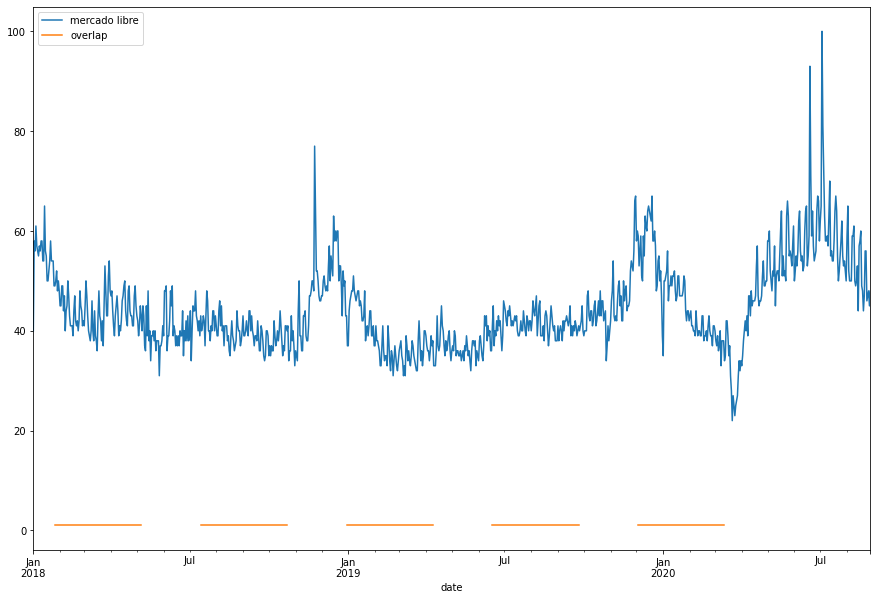

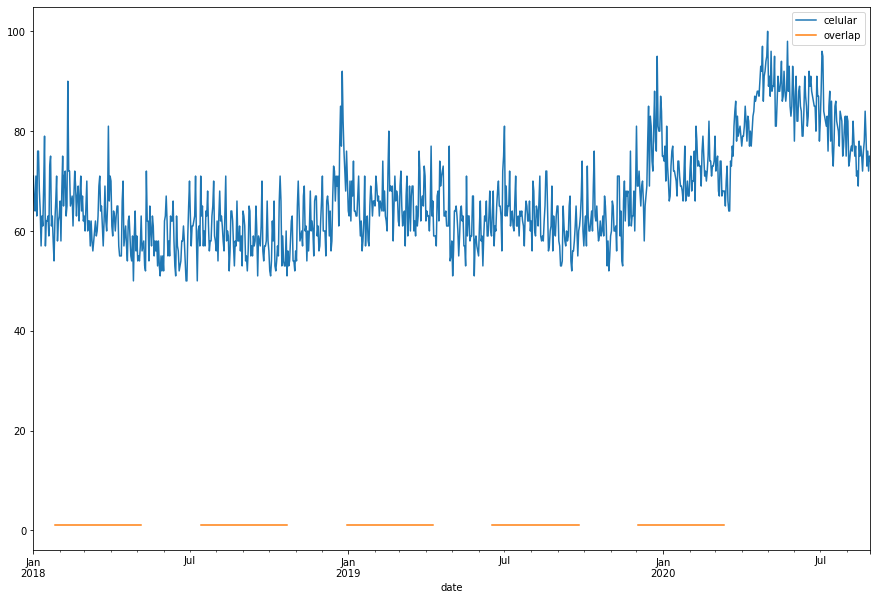

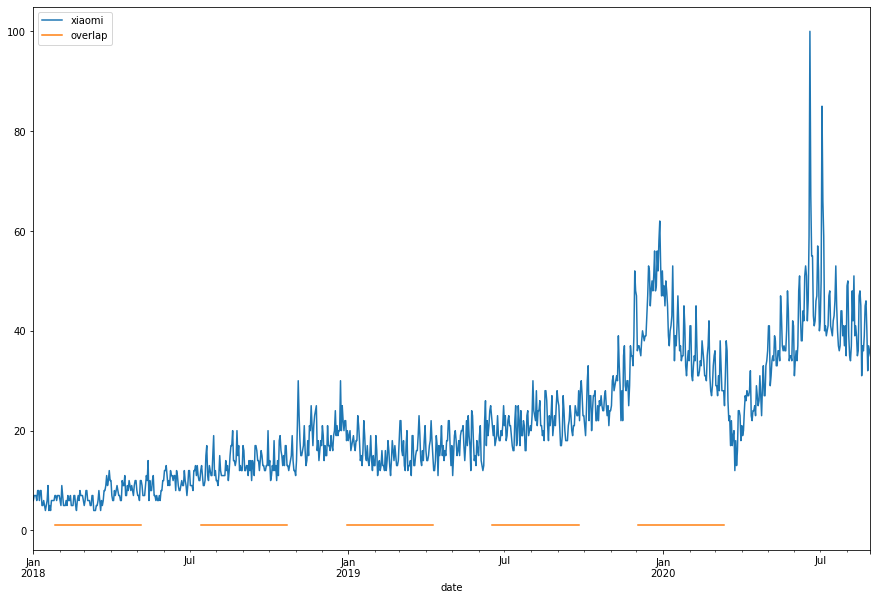

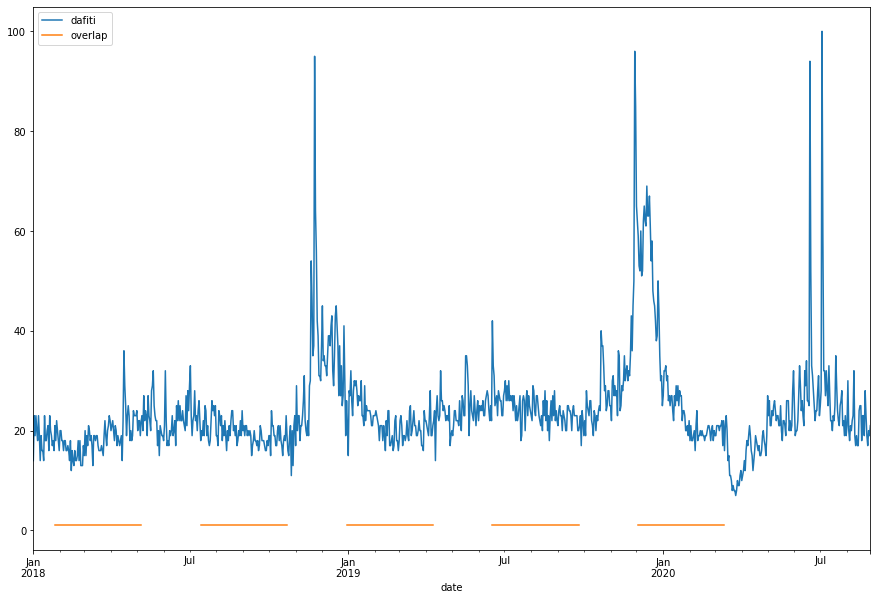

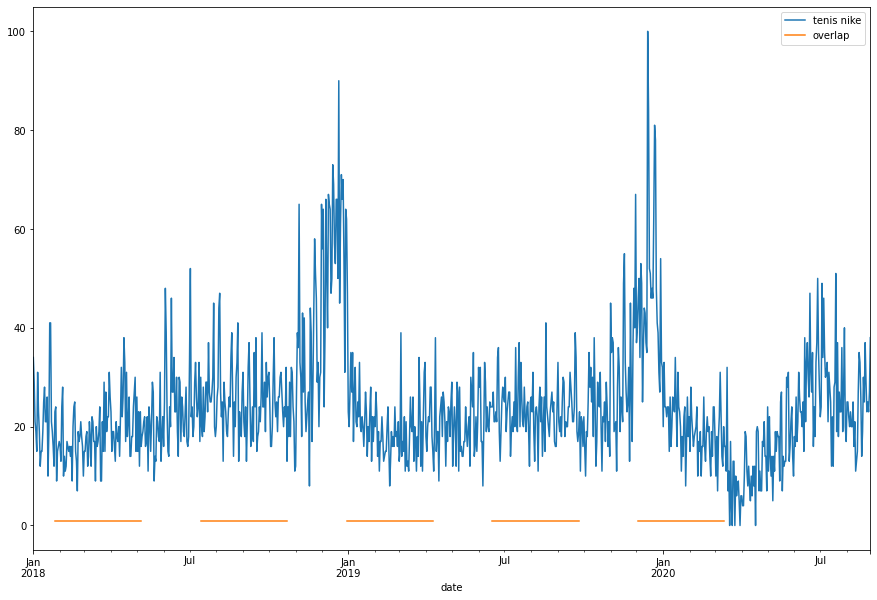

...

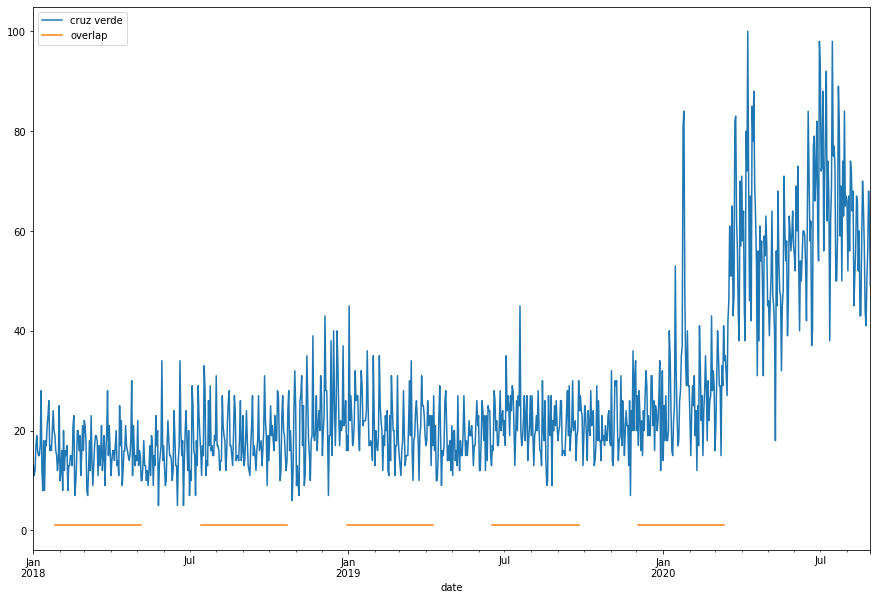

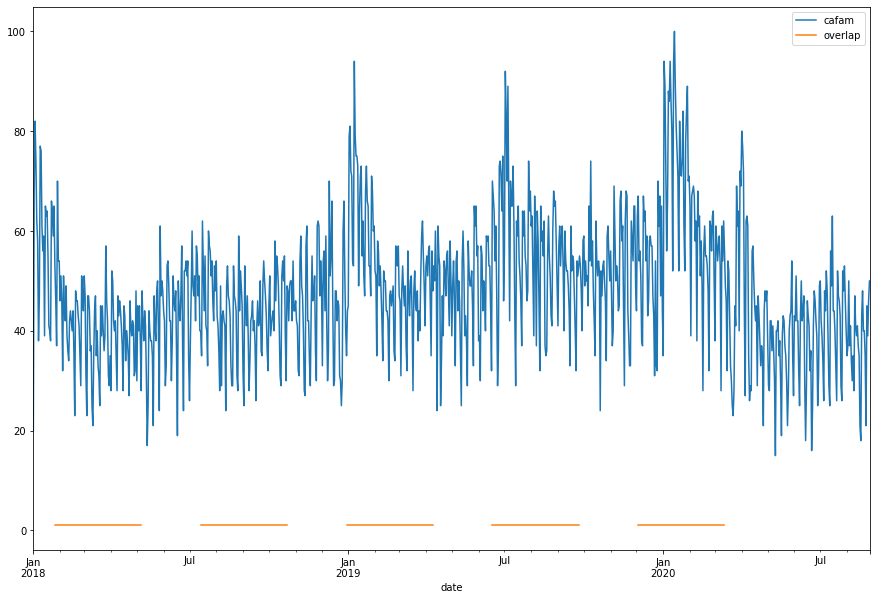

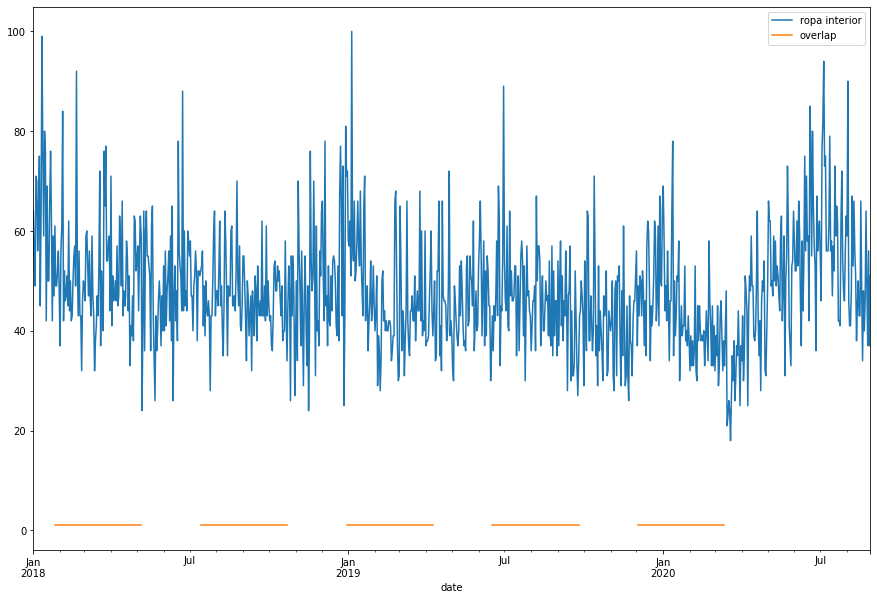

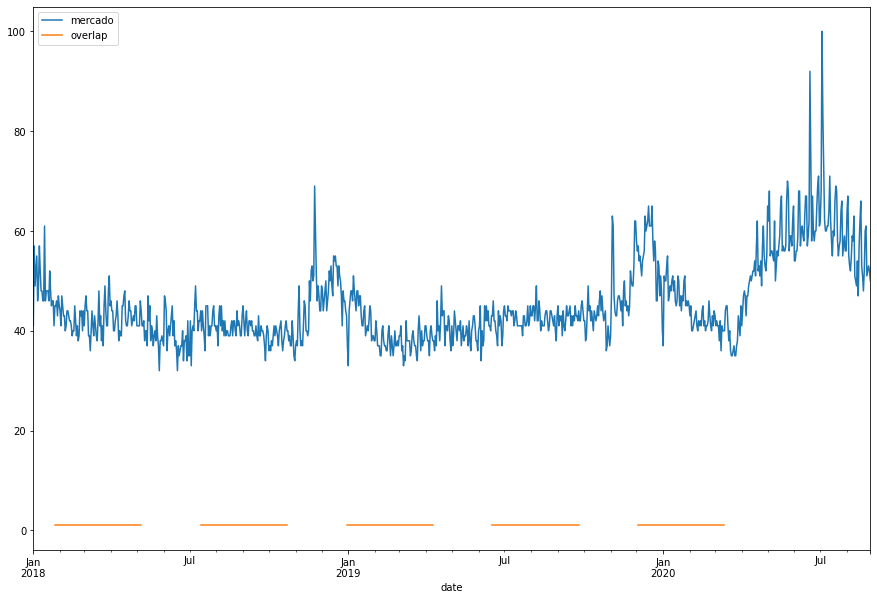

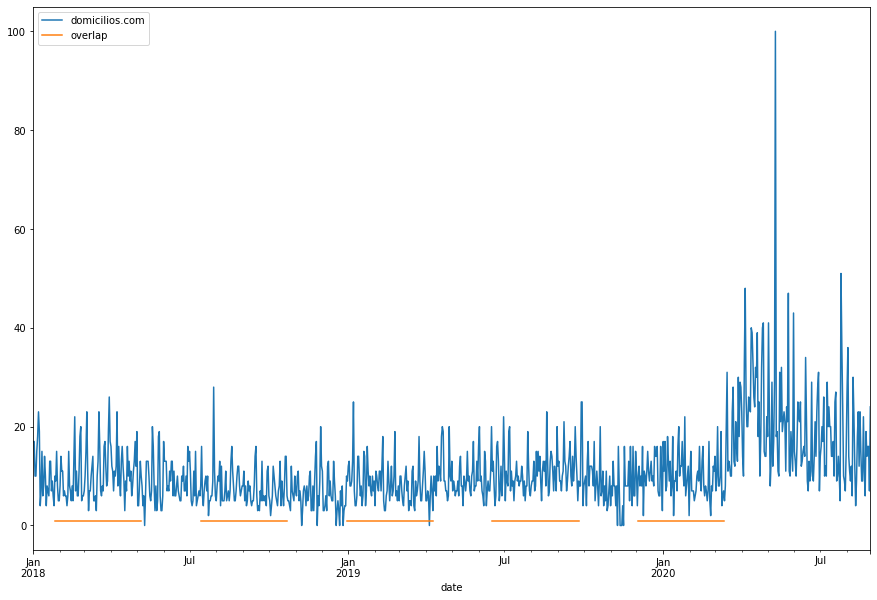

In [2]:
import datetime
import openpyxl
from openpyxl import load_workbook

def getYesterday():
    today = datetime.date.today()
    oneday=datetime.timedelta(days=1)
    yesterday=today-oneday
    return yesterday

Today = str(time.strftime("%Y-%m-%d"))
Yesterday = str(getYesterday())

print(Yesterday)
print(Today)

docs = openpyxl.load_workbook ("busqueda.xlsx")
hoja = docs.get_sheet_by_name("lista")

lst = []

for columna in hoja.iter_rows():
    bien = columna[0].value
    lst.append(bien)

pytrends = TrendReq(hl='es', tz=360, timeout=(10,25), retries=2, requests_args={'verify':False})
datag = pd.DataFrame()

for ite in lst:
    overlapping = get_daily_trend(pytrends,ite,"2018-01-01","2020-08-28", geo = "CO")
    print(overlapping)
    overlapping.plot(figsize=(15,10))
    datag[ite] = overlapping[ite]

In [3]:
datag.head()

,mercado libre,celular,xiaomi,dafiti,tenis nike,televisor,nevera,lavadora,falabella,linio,...,tellenzi,almacenes corona,lafam,productos naturales,drogueria,cruz verde,cafam,ropa interior,mercado,domicilios.com
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,40.0,71.0,6.0,14.0,34.0,23.0,8.0,14.0,5.0,6.0,...,0.0,0.0,0.0,60.0,45.0,13.0,20.0,64.0,41.0,17.0
2018-01-02,58.0,66.0,7.0,23.0,29.0,10.0,25.0,23.0,7.0,21.0,...,0.0,0.0,33.0,39.0,51.0,11.0,68.0,55.0,57.0,17.0
2018-01-03,56.0,64.0,7.0,19.0,21.0,14.0,22.0,22.0,7.0,23.0,...,0.0,41.0,30.0,68.0,53.0,12.0,82.0,49.0,49.0,10.0
2018-01-04,61.0,71.0,7.0,23.0,19.0,10.0,36.0,23.0,7.0,15.0,...,0.0,0.0,30.0,68.0,49.0,17.0,74.0,71.0,52.0,10.0
2018-01-05,57.0,63.0,6.0,20.0,15.0,16.0,36.0,17.0,7.0,20.0,...,0.0,0.0,81.0,81.0,56.0,19.0,62.0,70.0,55.0,15.0


# Guardar la información en un excel

In [5]:
book = load_workbook('Google trends.xlsx')
writer = pd.ExcelWriter('Google trends.xlsx', engine = 'openpyxl')
writer.book = book
datag.to_excel(writer, sheet_name = "Trends", index = True)
writer.save()

E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'trends.google.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(
E:\Anaconda\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverifie

            seguros  overlap
date                        
2019-01-01     29.0      1.0
2019-01-02     75.0      1.0
2019-01-03     79.0      1.0
2019-01-04     74.0      1.0
2019-01-05     42.0      1.0
...             ...      ...
2020-08-24     71.0      NaN
2020-08-25     66.0      NaN
2020-08-26     73.0      NaN
2020-08-27     69.0      NaN
2020-08-28     62.0      NaN

[606 rows x 2 columns]


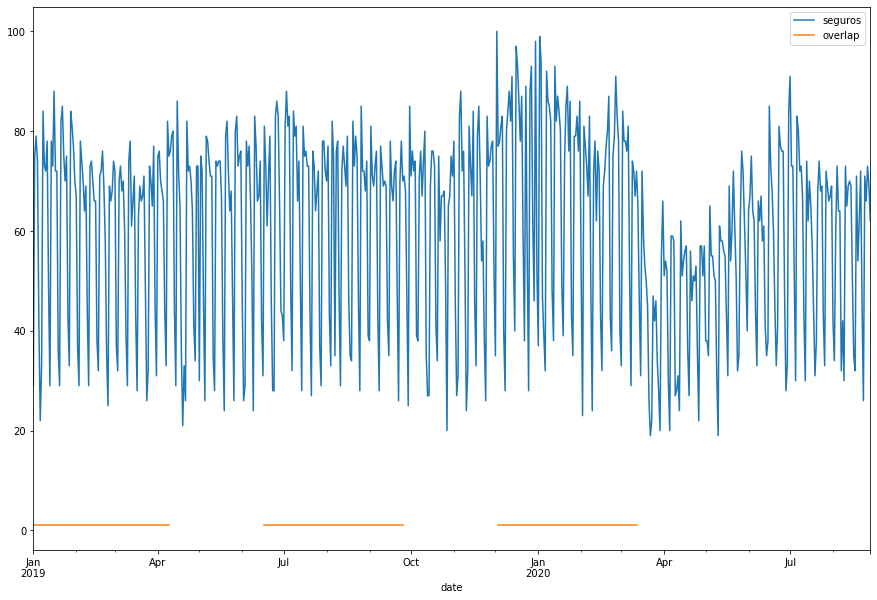

In [95]:
overlapping = get_daily_trend(pytrends,"seguros","2019-01-01","2020-08-28", geo = "CO")
print(overlapping)
overlapping.plot(figsize=(15,10))

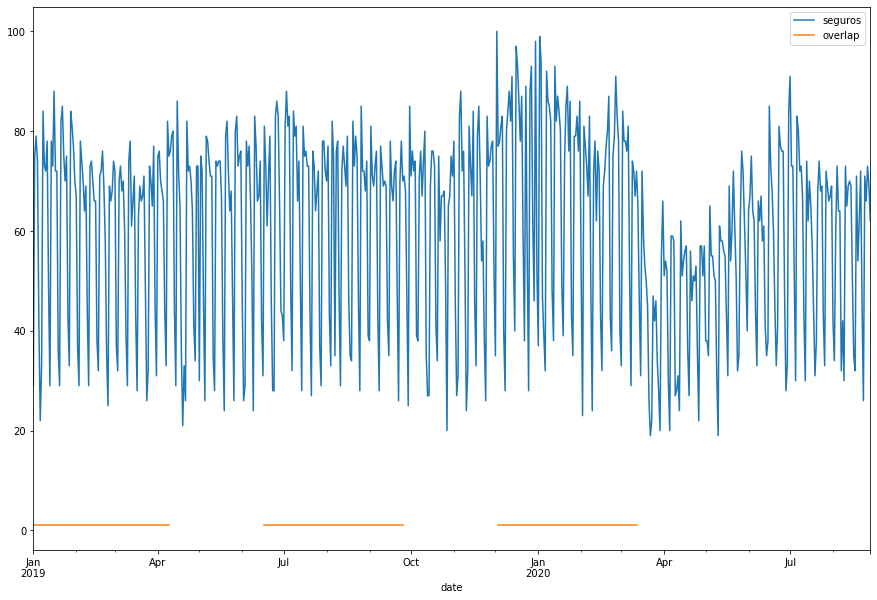

In [96]:
overlapping.plot(figsize=(15,10))

# Organizando la información

In [1067]:
import pandas as pd
import numpy as np

In [1068]:
import random
random.seed(42)

In [1069]:
data = pd.read_excel("consolidado_ventas.xlsx", usecols = range(5), index_col = "Fecha")

In [1070]:
datag = pd.read_excel("Google trends.xlsx",sheet_name = "Trends2", index_col = "date")

In [1071]:
datag.head()

,mercado libre,celular,xiaomi,dafiti,tenis nike,televisor,nevera,lavadora,falabella,linio,...,tellenzi,almacenes corona,lafam,productos naturales,drogueria,cruz verde,cafam,ropa interior,mercado,domicilios.com
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,40,71,6,14,34,23,8,14,5,6,...,0,0,0,60,45,13,20,64,41,17
2018-01-02,58,66,7,23,29,10,25,23,7,21,...,0,0,33,39,51,11,68,55,57,17
2018-01-03,56,64,7,19,21,14,22,22,7,23,...,0,41,30,68,53,12,82,49,49,10
2018-01-04,61,71,7,23,19,10,36,23,7,15,...,0,0,30,68,49,17,74,71,52,10
2018-01-05,57,63,6,20,15,16,36,17,7,20,...,0,0,81,81,56,19,62,70,55,15


In [1072]:
datag = datag.iloc[365:,:]

In [1073]:
datag.head()

,mercado libre,celular,xiaomi,dafiti,tenis nike,televisor,nevera,lavadora,falabella,linio,...,tellenzi,almacenes corona,lafam,productos naturales,drogueria,cruz verde,cafam,ropa interior,mercado,domicilios.com
date,,,,,,,,,,,,,,,,,,,,,
2019-01-01,37,64,18,15,23,14,19,12,6,8,...,0,0,0,0,47,16,45,58,33,12
2019-01-02,44,63,19,28,20,17,28,27,9,13,...,0,0,73,24,59,45,79,57,44,13
2019-01-03,46,70,20,27,27,25,30,30,9,10,...,0,0,45,21,64,22,81,62,46,8
2019-01-04,47,62,16,32,35,19,26,26,9,13,...,70,0,42,22,58,27,72,51,48,8
2019-01-05,48,70,17,26,27,20,23,28,9,10,...,0,0,54,11,62,23,71,100,48,9


In [1074]:
data.head()

,fecha,red 1,red 2,red 3
Fecha,,,,
2018-01-01,ene-01-18,2502189024,6434201694,NaN
2018-01-02,ene-02-18,9697733540,25195925199,NaN
2018-01-03,ene-03-18,11305167032,27749859504,NaN
2018-01-04,ene-04-18,10585229865,29442583917,NaN
2018-01-05,ene-05-18,11793251314,29603439148,NaN


In [1075]:
data = data.iloc[365:,:]

In [1076]:
data.head()

,fecha,red 1,red 2,red 3
Fecha,,,,
2019-01-01,ene-01-19,3485637679,9206319899,1.436960e+09
2019-01-02,ene-02-19,13489546168,32071579346,8.426395e+09
2019-01-03,ene-03-19,15373227068,30970696791,8.910280e+09
2019-01-04,ene-04-19,15498616042,34242252915,1.032185e+10
2019-01-05,ene-05-19,8556304856,19812816409,3.223691e+09


In [1077]:
data = data.iloc[:, 1:]

In [1078]:
data.head()

,red 1,red 2,red 3
Fecha,,,
2019-01-01,3485637679,9206319899,1.436960e+09
2019-01-02,13489546168,32071579346,8.426395e+09
2019-01-03,15373227068,30970696791,8.910280e+09
2019-01-04,15498616042,34242252915,1.032185e+10
2019-01-05,8556304856,19812816409,3.223691e+09


In [1079]:
y = data.iloc[:, 2:]

In [1015]:
y.head()

,red 3
Fecha,
2019-01-01,1.436960e+09
2019-01-02,8.426395e+09
2019-01-03,8.910280e+09
2019-01-04,1.032185e+10
2019-01-05,3.223691e+09


In [1016]:
data = data.iloc[:, :2]

In [1017]:
data.head()

,red 1,red 2
Fecha,,
2019-01-01,3485637679,9206319899
2019-01-02,13489546168,32071579346
2019-01-03,15373227068,30970696791
2019-01-04,15498616042,34242252915
2019-01-05,8556304856,19812816409


In [1018]:
Data = pd.concat([data, datag], axis = 1, sort = False)

In [1019]:
Data.head()

,red 1,red 2,mercado libre,celular,xiaomi,dafiti,tenis nike,televisor,nevera,lavadora,...,tellenzi,almacenes corona,lafam,productos naturales,drogueria,cruz verde,cafam,ropa interior,mercado,domicilios.com
2019-01-01,3485637679,9206319899,37,64,18,15,23,14,19,12,...,0,0,0,0,47,16,45,58,33,12
2019-01-02,13489546168,32071579346,44,63,19,28,20,17,28,27,...,0,0,73,24,59,45,79,57,44,13
2019-01-03,15373227068,30970696791,46,70,20,27,27,25,30,30,...,0,0,45,21,64,22,81,62,46,8
2019-01-04,15498616042,34242252915,47,62,16,32,35,19,26,26,...,70,0,42,22,58,27,72,51,48,8
2019-01-05,8556304856,19812816409,48,70,17,26,27,20,23,28,...,0,0,54,11,62,23,71,100,48,9


In [1020]:
X = Data

In [1021]:
X.head()

,red 1,red 2,mercado libre,celular,xiaomi,dafiti,tenis nike,televisor,nevera,lavadora,...,tellenzi,almacenes corona,lafam,productos naturales,drogueria,cruz verde,cafam,ropa interior,mercado,domicilios.com
2019-01-01,3485637679,9206319899,37,64,18,15,23,14,19,12,...,0,0,0,0,47,16,45,58,33,12
2019-01-02,13489546168,32071579346,44,63,19,28,20,17,28,27,...,0,0,73,24,59,45,79,57,44,13
2019-01-03,15373227068,30970696791,46,70,20,27,27,25,30,30,...,0,0,45,21,64,22,81,62,46,8
2019-01-04,15498616042,34242252915,47,62,16,32,35,19,26,26,...,70,0,42,22,58,27,72,51,48,8
2019-01-05,8556304856,19812816409,48,70,17,26,27,20,23,28,...,0,0,54,11,62,23,71,100,48,9


In [1022]:
y.head()

,red 3
Fecha,
2019-01-01,1.436960e+09
2019-01-02,8.426395e+09
2019-01-03,8.910280e+09
2019-01-04,1.032185e+10
2019-01-05,3.223691e+09


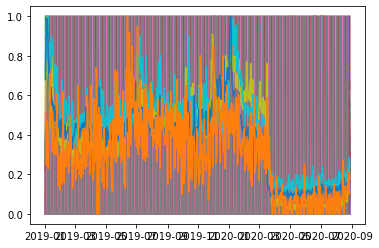

In [511]:
for itm in X:
    grafic = pyplot.plot(X[itm])
    #print(itm)
    #pyplot.show()

# Divivir el conjunto de datos

In [1024]:
split = int(len(Data)*0.8) 
X_train, X_test, y_train, y_test = X [: split], X [split:], y [: split], y [split:]

In [1025]:
#El modelo utiliza los datos de entrenamiento para llegar a los pesos del modelo.
#El conjunto de datos de prueba se utiliza para ver cómo funcionará el modelo con los nuevos datos que se introducirían en el modelo. 

# Escala de características

In [1026]:
#from sklearn.preprocessing import StandardScaler
#sc = StandardScaler() 
#X_train = sc.fit_transform(X_train) 
#X_test = sc.transform(X_test)
#y_train = sc.fit_transform(y_train) 
#y_test = sc.transform(y_test)

In [1027]:
#Este proceso hace que la media de todas las características de entrada sea igual a cero 
#y también convierte su varianza en 1. Esto asegura que no haya sesgo durante el entrenamiento 
#del modelo debido a las diferentes escalas de todas las características de entrada. Si esto no se hace, 
#la red neuronal podría confundirse y dar un mayor peso a aquellas características que tienen un valor promedio 
#más alto que otras.

# Construyendo la red neuronal artificial

In [1028]:
#!pip install keras

In [1029]:
#!pip install tensorflow

In [1059]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import LSTM

In [1060]:
#Ahora importaremos las funciones que se utilizarán para construir la red neuronal artificial. 
#Importamos el método Sequential de la biblioteca keras.models. Esto se utilizará para construir 
#secuencialmente las capas del aprendizaje de redes neuronales. El siguiente método que importaremos 
#será la función Dense de la biblioteca keras.layers.

In [1061]:
model = Sequential()

In [1062]:
model.add(Dense(units = 300, activation = "relu",input_dim = (X.shape[1])))

In [1063]:
model.add(Dense(units = 65, activation = "relu"))

In [1064]:
model.add(Dense(1))

In [1065]:
#opt = SGD(lr=0.01, momentum=0.9)
#model.compile(loss='...', optimizer=opt)
# fit model
#model.compile(optimizer = "adam", loss = "mae")
model.compile(optimizer = "adam", loss = "mean_squared_logarithmic_error")
#model.compile(optimizer = "adam", loss = "mse")
#mean_squared_error

In [1066]:
history = model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 60)

Epoch 1/500
9/9 [==============================] - 1s 79ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 2/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 3/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 4/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 5/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1956 - val_loss: 579.2269
Epoch 6/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 7/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 8/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 9/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 10/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_los

Epoch 161/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 162/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 163/500
9/9 [==============================] - 0s 4ms/step - loss: 525.1956 - val_loss: 579.2269
Epoch 164/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 165/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 166/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 167/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 168/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 169/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 170/500
9/9 [==============================] - 0s 3ms/step - loss: 

9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 320/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 321/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 322/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 323/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 324/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 325/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 326/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 327/500
9/9 [==============================] - 0s 4ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 328/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val

9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 478/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 479/500
9/9 [==============================] - 0s 4ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 480/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 481/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 482/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 483/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1954 - val_loss: 579.2269
Epoch 484/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 485/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val_loss: 579.2269
Epoch 486/500
9/9 [==============================] - 0s 3ms/step - loss: 525.1955 - val

In [882]:
# model.compile(loss='mean_squared_error')
#El error cuadrático medio se calcula como el promedio de las diferencias cuadráticas entre los valores predichos y reales. 
#El resultado es siempre positivo independientemente del signo de los valores predichos y reales y un valor perfecto es 0.0. 
#El cuadrado significa que los errores más grandes dan como resultado más errores que los errores más pequeños, lo que significa 
#que el modelo es castigado por cometer errores más grandes.

In [883]:
#Según Kingma et al., 2014 , el método es " computacionalmente eficiente, tiene pocos requisitos de memoria, 
#invariante al reajuste diagonal de gradientes y es muy adecuado para problemas que son grandes en términos 
#de datos / parámetros ".

# Evaluando el modelo

In [1046]:
_, train_mse = model.evaluate(X_train, y_train, verbose=0)
_, test_mse = model.evaluate(X_test, y_test, verbose=0)
print("Train: %.3f, Test: %.3f" % (train_mse, test_mse))

TypeError: cannot unpack non-iterable float object

In [1047]:
from matplotlib import pyplot

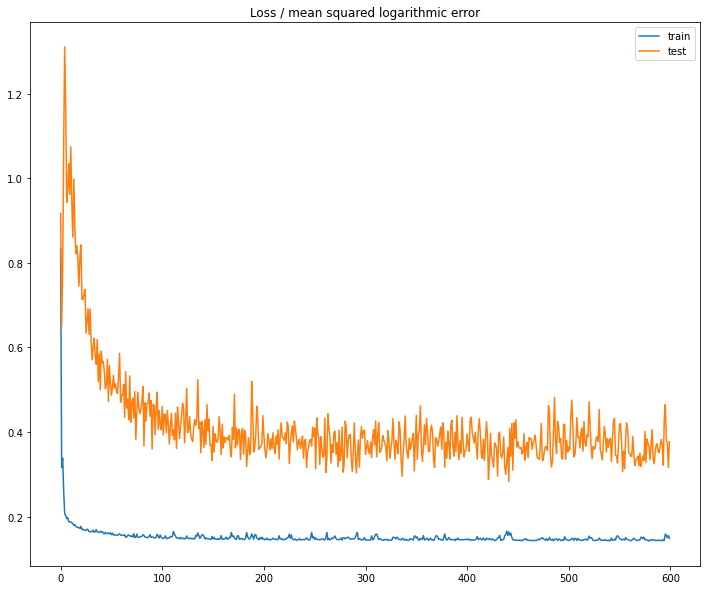

In [1048]:
pyplot.title('Loss / mean squared logarithmic error')
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

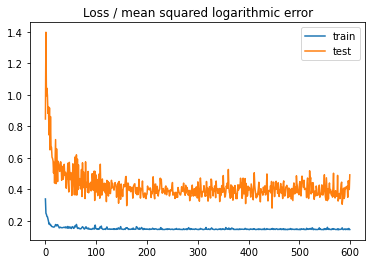

In [436]:
pyplot.title('Loss / mean squared logarithmic error') #600-60
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

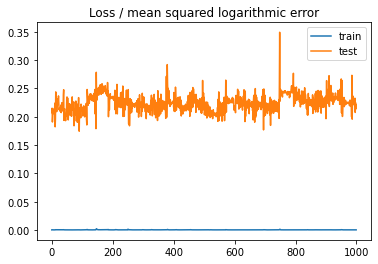

In [44]:
pyplot.title('Loss / mean squared logarithmic error') #20
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

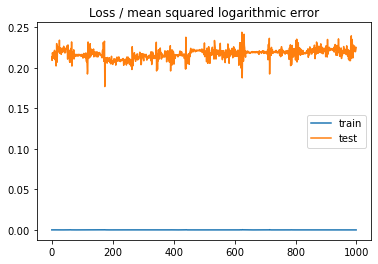

In [46]:
pyplot.title('Loss / mean squared logarithmic error') #30
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

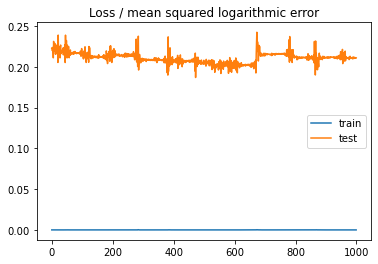

In [48]:
pyplot.title('Loss / mean squared logarithmic error') #40
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

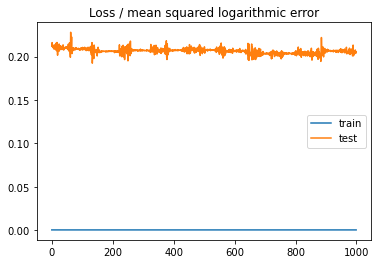

In [50]:
pyplot.title('Loss / mean squared logarithmic error') #50
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

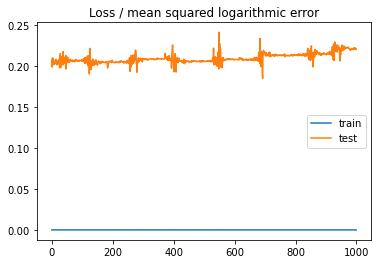

In [53]:
pyplot.title('Loss / mean squared logarithmic error') #60
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

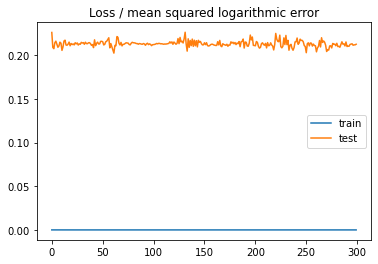

In [57]:
pyplot.title('Loss / mean squared logarithmic error') #60-300
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

# Predección

In [1049]:
data = pd.read_excel("consolidado_ventas.xlsx", usecols = range(5), index_col = "Fecha")

In [1050]:
y_pred = model.predict(X_test)

In [1051]:
data['y_pred'] = np.NaN
data.iloc[(len(data) - len(y_pred)):,-1:] = y_pred

In [1052]:
data.head()

,fecha,red 1,red 2,red 3,y_pred
Fecha,,,,,
2018-01-01,ene-01-18,2502189024,6434201694,NaN,NaN
2018-01-02,ene-02-18,9697733540,25195925199,NaN,NaN
2018-01-03,ene-03-18,11305167032,27749859504,NaN,NaN
2018-01-04,ene-04-18,10585229865,29442583917,NaN,NaN
2018-01-05,ene-05-18,11793251314,29603439148,NaN,NaN


In [1053]:
data = data.dropna()

In [217]:
data[["y_pred", "red 3"]].plot(figsize=(10,8))

KeyError: "None of [Index(['y_pred', 'red 3'], dtype='object')] are in the [columns]"

# Modelo de Ridge & Lasso
# Ejemplo

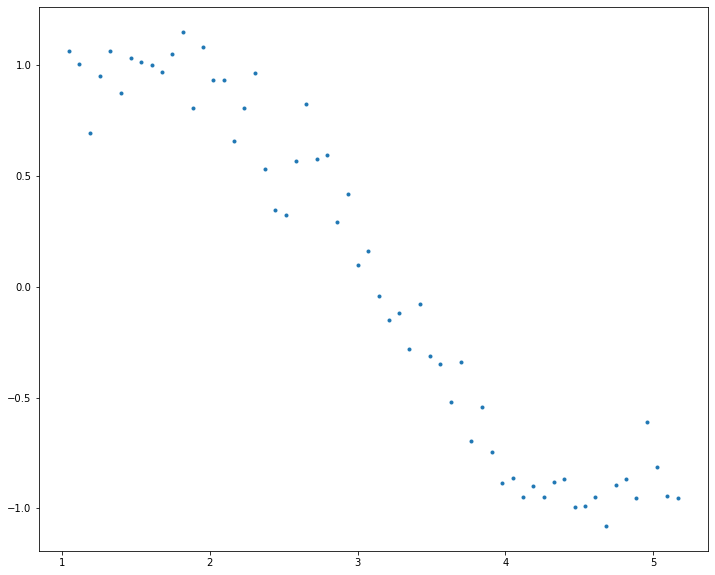

In [2]:
#Importing libraries. The same will be used throughout the article.
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 10

#Define input array with angles from 60deg to 300deg converted to radians
x = np.array([i*np.pi/180 for i in range(60,300,4)])
np.random.seed(10)  #Setting seed for reproducibility
y = np.sin(x) + np.random.normal(0,0.15,len(x))
data = pd.DataFrame(np.column_stack([x,y]),columns=['x','y'])
plt.plot(data['x'],data['y'],'.')

In [3]:
for i in range(2,16):  #power of 1 is already there
    colname = 'x_%d'%i      #new var will be x_power
    data[colname] = data['x']**i
data.head()

,x,y,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,x_11,x_12,x_13,x_14,x_15
0,1.047198,1.065763,1.096623,1.148381,1.202581,1.259340,1.318778,1.381021,1.446202,1.514459,1.585938,1.660790,1.739176,1.821260,1.907219,1.997235
1,1.117011,1.006086,1.247713,1.393709,1.556788,1.738948,1.942424,2.169709,2.423588,2.707173,3.023942,3.377775,3.773011,4.214494,4.707635,5.258479
2,1.186824,0.695374,1.408551,1.671702,1.984016,2.354677,2.794587,3.316683,3.936319,4.671717,5.544505,6.580351,7.809718,9.268760,11.000386,13.055521
3,1.256637,0.949799,1.579137,1.984402,2.493673,3.133642,3.937850,4.948448,6.218404,7.814277,9.819710,12.339811,15.506664,19.486248,24.487142,30.771450
4,1.326450,1.063496,1.759470,2.333850,3.095735,4.106339,5.446854,7.224981,9.583578,12.712139,16.862020,22.366630,29.668222,39.353420,52.200353,69.241170


In [4]:
#Import Linear Regression model from scikit-learn.
from sklearn.linear_model import LinearRegression
def linear_regression(data, power, models_to_plot):
    #initialize predictors:
    predictors=['x']
    if power>=2:
        predictors.extend(['x_%d'%i for i in range(2,power+1)])
    
    #Fit the model
    linreg = LinearRegression(normalize=True)
    linreg.fit(data[predictors],data['y'])
    y_pred = linreg.predict(data[predictors])
    
    #Check if a plot is to be made for the entered power
    if power in models_to_plot:
        plt.subplot(models_to_plot[power])
        plt.tight_layout()
        plt.plot(data['x'],y_pred)
        plt.plot(data['x'],data['y'],'.')
        plt.title('Plot for power: %d'%power)
    
    #Return the result in pre-defined format
    rss = sum((y_pred-data['y'])**2)
    ret = [rss]
    ret.extend([linreg.intercept_])
    ret.extend(linreg.coef_)
    return ret

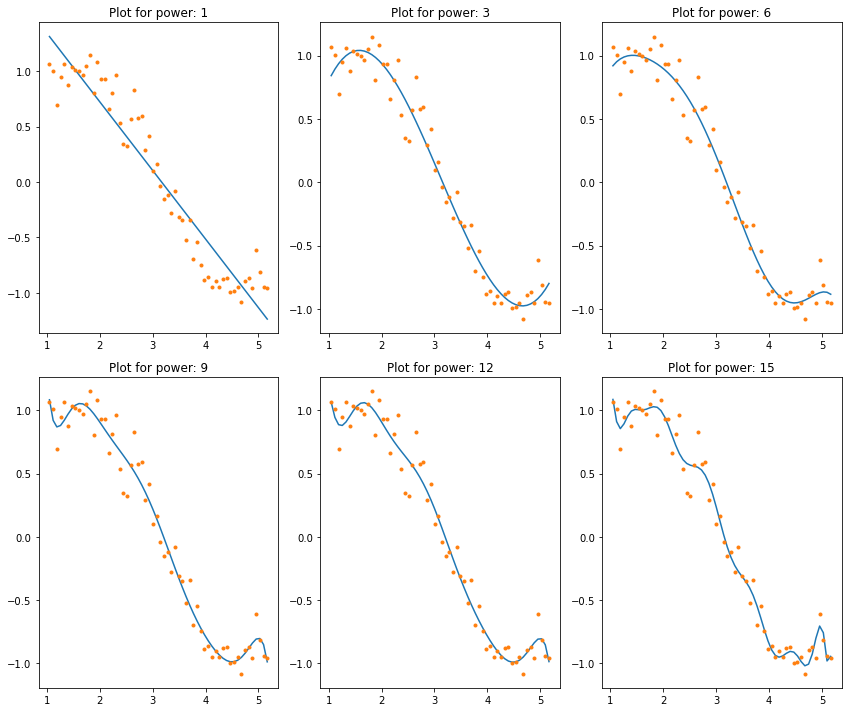

In [5]:
#Initialize a dataframe to store the results:
col = ['rss','intercept'] + ['coef_x_%d'%i for i in range(1,16)]
ind = ['model_pow_%d'%i for i in range(1,16)]
coef_matrix_simple = pd.DataFrame(index=ind, columns=col)

#Define the powers for which a plot is required:
models_to_plot = {1:231,3:232,6:233,9:234,12:235,15:236}

#Iterate through all powers and assimilate results
for i in range(1,16):
    coef_matrix_simple.iloc[i-1,0:i+2] = linear_regression(data, power=i, models_to_plot=models_to_plot)

In [6]:
#Set the display format to be scientific for ease of analysis
pd.options.display.float_format = '{:,.2g}'.format
coef_matrix_simple

,rss,intercept,coef_x_1,coef_x_2,coef_x_3,coef_x_4,coef_x_5,coef_x_6,coef_x_7,coef_x_8,coef_x_9,coef_x_10,coef_x_11,coef_x_12,coef_x_13,coef_x_14,coef_x_15
model_pow_1,3.3,2,-0.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_2,3.3,1.9,-0.58,-0.006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_3,1.1,-1.1,3,-1.3,0.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_4,1.1,-0.27,1.7,-0.53,-0.036,0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_5,1,3,-5.1,4.7,-1.9,0.33,-0.021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_6,0.99,-2.8,9.5,-9.7,5.2,-1.6,0.23,-0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_7,0.93,19,-56,69,-45,17,-3.5,0.4,-0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_8,0.92,43,-1.4e+02,1.8e+02,-1.3e+02,58,-15,2.4,-0.21,0.0077,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_9,0.87,1.7e+02,-6.1e+02,9.6e+02,-8.5e+02,4.6e+02,-1.6e+02,37,-5.2,0.42,-0.015,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_10,0.87,1.4e+02,-4.9e+02,7.3e+02,-6e+02,2.9e+02,-87,15,-0.81,-0.14,0.026,-0.0013,NaN,NaN,NaN,NaN,NaN


# 3. Ridge Regression
## Ejemplo

In [9]:
from sklearn.linear_model import Ridge
def ridge_regression(data, predictors, alpha, models_to_plot={}):
    #Fit the model
    ridgereg = Ridge(alpha=alpha,normalize=True)
    ridgereg.fit(data[predictors],data['y'])
    y_pred = ridgereg.predict(data[predictors])
    
    #Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:
        plt.subplot(models_to_plot[alpha])
        plt.tight_layout()
        plt.plot(data['x'],y_pred)
        plt.plot(data['x'],data['y'],'.')
        plt.title('Plot for alpha: %.3g'%alpha)
    
    #Return the result in pre-defined format
    rss = sum((y_pred-data['y'])**2)
    ret = [rss]
    ret.extend([ridgereg.intercept_])
    ret.extend(ridgereg.coef_)
    return ret

E:\Anaconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=3.94081e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,


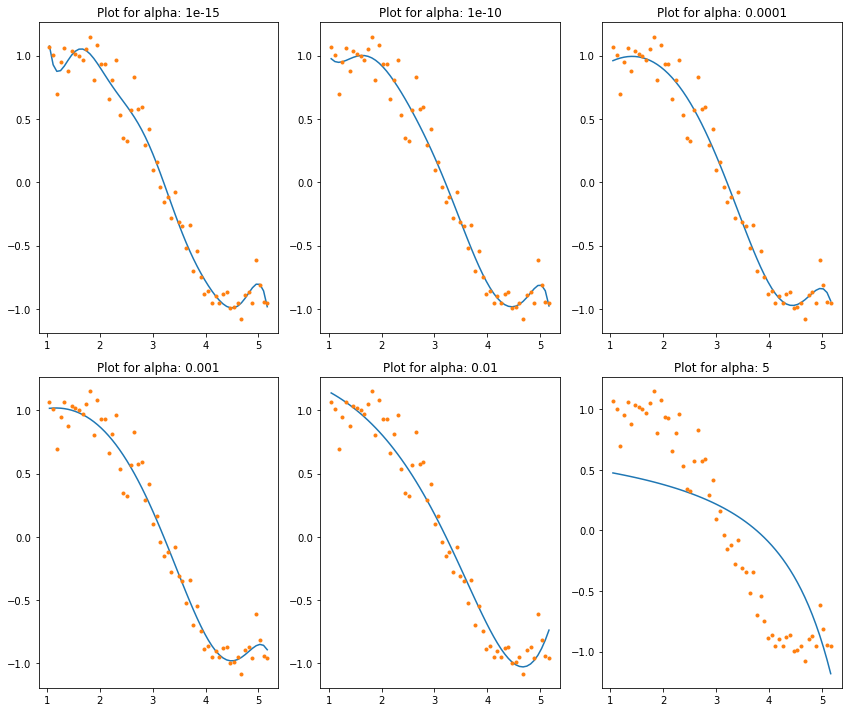

In [10]:
#Initialize predictors to be set of 15 powers of x
predictors=['x']
predictors.extend(['x_%d'%i for i in range(2,16)])

#Set the different values of alpha to be tested
alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 10, 20]

#Initialize the dataframe for storing coefficients.
col = ['rss','intercept'] + ['coef_x_%d'%i for i in range(1,16)]
ind = ['alpha_%.2g'%alpha_ridge[i] for i in range(0,10)]
coef_matrix_ridge = pd.DataFrame(index=ind, columns=col)

models_to_plot = {1e-15:231, 1e-10:232, 1e-4:233, 1e-3:234, 1e-2:235, 5:236}
for i in range(10):
    coef_matrix_ridge.iloc[i,] = ridge_regression(data, predictors, alpha_ridge[i], models_to_plot)

In [11]:
#Set the display format to be scientific for ease of analysis
pd.options.display.float_format = '{:,.2g}'.format
coef_matrix_ridge

,rss,intercept,coef_x_1,coef_x_2,coef_x_3,coef_x_4,coef_x_5,coef_x_6,coef_x_7,coef_x_8,coef_x_9,coef_x_10,coef_x_11,coef_x_12,coef_x_13,coef_x_14,coef_x_15
alpha_1e-15,0.87,94,-3e+02,3.8e+02,-2.4e+02,67,-0.5,-4.2,0.46,0.17,-0.027,-0.0058,0.001,0.00016,-4.4e-05,2.8e-06,-2.4e-08
alpha_1e-10,0.92,11,-29,31,-15,2.9,0.17,-0.091,-0.011,0.002,0.00064,2.4e-05,-2e-05,-4.2e-06,2.2e-07,2.3e-07,-2.3e-08
alpha_1e-08,0.95,1.3,-1.5,1.7,-0.68,0.039,0.016,0.00016,-0.00036,-5.4e-05,-2.9e-07,1.1e-06,1.9e-07,2e-08,3.9e-09,8.2e-10,-4.6e-10
alpha_0.0001,0.96,0.56,0.55,-0.13,-0.026,-0.0028,-0.00011,4.1e-05,1.5e-05,3.7e-06,7.4e-07,1.3e-07,1.9e-08,1.9e-09,-1.3e-10,-1.5e-10,-6.2e-11
alpha_0.001,1,0.82,0.31,-0.087,-0.02,-0.0028,-0.00022,1.8e-05,1.2e-05,3.4e-06,7.3e-07,1.3e-07,1.9e-08,1.7e-09,-1.5e-10,-1.4e-10,-5.2e-11
alpha_0.01,1.4,1.3,-0.088,-0.052,-0.01,-0.0014,-0.00013,7.2e-07,4.1e-06,1.3e-06,3e-07,5.6e-08,9e-09,1.1e-09,4.3e-11,-3.1e-11,-1.5e-11
alpha_1,5.6,0.97,-0.14,-0.019,-0.003,-0.00047,-7e-05,-9.9e-06,-1.3e-06,-1.4e-07,-9.3e-09,1.3e-09,7.8e-10,2.4e-10,6.2e-11,1.4e-11,3.2e-12
alpha_5,14,0.55,-0.059,-0.0085,-0.0014,-0.00024,-4.1e-05,-6.9e-06,-1.1e-06,-1.9e-07,-3.1e-08,-5.1e-09,-8.2e-10,-1.3e-10,-2e-11,-3e-12,-4.2e-13
alpha_10,18,0.4,-0.037,-0.0055,-0.00095,-0.00017,-3e-05,-5.2e-06,-9.2e-07,-1.6e-07,-2.9e-08,-5.1e-09,-9.1e-10,-1.6e-10,-2.9e-11,-5.1e-12,-9.1e-13
alpha_20,23,0.28,-0.022,-0.0034,-0.0006,-0.00011,-2e-05,-3.6e-06,-6.6e-07,-1.2e-07,-2.2e-08,-4e-09,-7.5e-10,-1.4e-10,-2.5e-11,-4.7e-12,-8.7e-13


# Modelación

In [483]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error

In [484]:
import random
random.seed(42)

In [485]:
data = pd.read_excel("consolidado_ventas.xlsx", usecols = range(6), index_col = "Fecha")

In [486]:
data.head()

,fecha,red 1,red 2,red 3,Total
Fecha,,,,,
2018-01-01,ene-01-18,2502189024,6434201694,NaN,NaN
2018-01-02,ene-02-18,9697733540,25195925199,NaN,NaN
2018-01-03,ene-03-18,11305167032,27749859504,NaN,NaN
2018-01-04,ene-04-18,10585229865,29442583917,NaN,NaN
2018-01-05,ene-05-18,11793251314,29603439148,NaN,NaN


In [487]:
datag = pd.read_excel("Google trends.xlsx",sheet_name = "Trends2", index_col = "date")

In [488]:
datag.head()

,mercado libre,celular,xiaomi,tenis nike,televisor,nevera,lavadora,falabella,linio,rappi,...,Martes,Miércoles,Jueves,Viernes,Sábado,Domingo,viva air,san andres,hotel,easy fly
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,40,71,6,34,23,8,14,5,6,5,...,0,0,0,0,0,0,0,71,52,51
2018-01-02,58,66,7,29,10,25,23,7,21,6,...,1,0,0,0,0,0,0,68,75,32
2018-01-03,56,64,7,21,14,22,22,7,23,4,...,0,1,0,0,0,0,2,89,77,64
2018-01-04,61,71,7,19,10,36,23,7,15,5,...,0,0,1,0,0,0,2,100,74,21
2018-01-05,57,63,6,15,16,36,17,7,20,5,...,0,0,0,1,0,0,0,72,78,29


In [489]:
datag = datag.iloc[365:,:]

In [490]:
data = data.iloc[365:, 1:]

In [491]:
data.head()

,red 1,red 2,red 3,Total
Fecha,,,,
2019-01-01,3485637679,9206319899,1.436960e+09,1.412892e+10
2019-01-02,13489546168,32071579346,8.426395e+09,5.398752e+10
2019-01-03,15373227068,30970696791,8.910280e+09,5.525420e+10
2019-01-04,15498616042,34242252915,1.032185e+10,6.006272e+10
2019-01-05,8556304856,19812816409,3.223691e+09,3.159281e+10


In [492]:
y = data.iloc[:, 3:]

In [493]:
y.head()

,Total
Fecha,
2019-01-01,1.412892e+10
2019-01-02,5.398752e+10
2019-01-03,5.525420e+10
2019-01-04,6.006272e+10
2019-01-05,3.159281e+10


In [494]:
X = datag

In [495]:
X.head()

,mercado libre,celular,xiaomi,tenis nike,televisor,nevera,lavadora,falabella,linio,rappi,...,Martes,Miércoles,Jueves,Viernes,Sábado,Domingo,viva air,san andres,hotel,easy fly
date,,,,,,,,,,,,,,,,,,,,,
2019-01-01,37,64,18,23,14,19,12,6,8,10,...,1,0,0,0,0,0,51,65,68,51
2019-01-02,44,63,19,20,17,28,27,9,13,10,...,0,1,0,0,0,0,77,84,89,45
2019-01-03,46,70,20,27,25,30,30,9,10,9,...,0,0,1,0,0,0,70,74,91,25
2019-01-04,47,62,16,35,19,26,26,9,13,13,...,0,0,0,1,0,0,100,71,99,47
2019-01-05,48,70,17,27,20,23,28,9,10,8,...,0,0,0,0,1,0,98,86,96,25


In [496]:
y.head()

,Total
Fecha,
2019-01-01,1.412892e+10
2019-01-02,5.398752e+10
2019-01-03,5.525420e+10
2019-01-04,6.006272e+10
2019-01-05,3.159281e+10


# Regresión de Ridge

## Encontrar el alfa idoneo

In [497]:
import pandas as pd
import numpy as np
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

In [498]:
X = X/X.max()

In [499]:
X.describe()

,mercado libre,celular,xiaomi,tenis nike,televisor,nevera,lavadora,falabella,linio,rappi,...,Martes,Miércoles,Jueves,Viernes,Sábado,Domingo,viva air,san andres,hotel,easy fly
count,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,...,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000,606.000000
mean,0.447244,0.703135,0.282112,0.227327,0.226056,0.279604,0.266304,0.091353,0.139538,0.220380,...,0.143564,0.143564,0.143564,0.143564,0.141914,0.141914,0.384521,0.450731,0.378861,0.299422
std,0.093755,0.103635,0.121241,0.108783,0.078921,0.076425,0.089883,0.060361,0.070266,0.099481,...,0.350937,0.350937,0.350937,0.350937,0.349250,0.349250,0.229444,0.207259,0.186137,0.193283
min,0.220000,0.510000,0.110000,0.000000,0.120000,0.170000,0.090000,0.040000,0.040000,0.080000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.076923,0.080000,0.000000
25%,0.380000,0.620000,0.190000,0.160000,0.180000,0.230000,0.210000,0.070000,0.100000,0.160000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.102500,0.208791,0.140000,0.140000
50%,0.420000,0.680000,0.250000,0.210000,0.210000,0.270000,0.250000,0.080000,0.130000,0.190000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.440000,0.483516,0.420000,0.290000
75%,0.500000,0.770000,0.360000,0.270000,0.260000,0.310000,0.300000,0.100000,0.160000,0.250000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.540000,0.571429,0.480000,0.437500
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [500]:
split = int(len(Data)*0.80) 
X_train, X_test, y_train, y_test = X [: split], X [split:], y [: split], y [split:]

In [501]:
print(X_train.shape); print(X_test.shape)

(484, 62)
(122, 62)


In [502]:
y_test

,Total
Fecha,
2020-04-29,7.829885e+10
2020-04-30,8.410474e+10
2020-05-01,7.071473e+10
2020-05-02,6.284436e+10
2020-05-03,5.152390e+10
...,...
2020-08-24,8.411480e+10
2020-08-25,8.130899e+10
2020-08-26,7.882539e+10


In [503]:
ridge = Ridge(alpha=0.0000000000000001)
ridge.fit(X_train, y_train) 
pred_train_r= ridge.predict(X_train)
print("Error medio (Train)",np.sqrt(mean_squared_error(y_train,pred_train_r)))
print("R cuadrado (Train)",r2_score(y_train, pred_train_r))

pred_test_r= ridge.predict(X_test)
np.sqrt(mean_squared_error(y_test,pred_test_r))
print("Error medio (test)",np.sqrt(mean_squared_error(y_test,pred_test_r))) 
print("R cuadrado (test)",(r2_score(y_test, pred_test_r)))

Error medio (Train) 6102216148.759883
R cuadrado (Train) 0.9207694996792632
Error medio (test) 17777332736.867725
R cuadrado (test) 0.8061116750505178


In [504]:
pred_test_r= ridge.predict(X_test)
dates = pd.date_range(start= "29/04/2020", end = "28/08/2020")
len(dates)
y_test["y pred Ridge"] = pred_test_r

<ipython-input-504-c4d9c0184a98>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test["y pred Ridge"] = pred_test_r


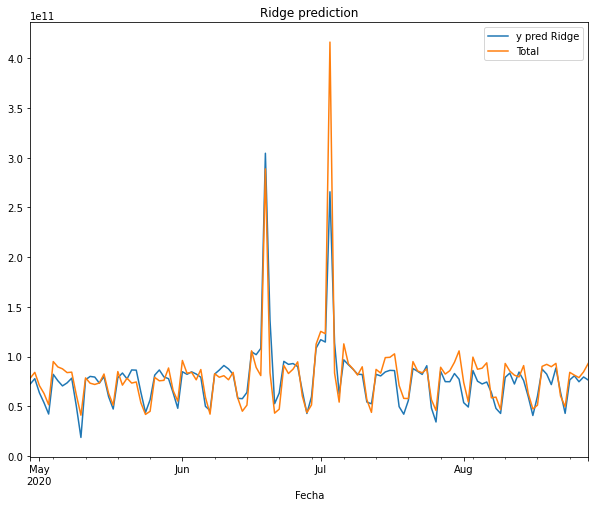

In [505]:
from matplotlib import pyplot
y_test[["y pred Ridge", "Total"]].plot(figsize=(10,8), title = "Ridge prediction")

# Regresión de Lasso

In [506]:
lasso = Lasso(alpha=0.0000000000000001)
lasso.fit(X_train, y_train) 
pred_train_lasso = lasso.predict(X_train)
print("Error medio (Train)",np.sqrt(mean_squared_error(y_train,pred_train_lasso)))
print("R cuadrado (Train)",r2_score(y_train, pred_train_lasso))

pred_test_lasso = lasso.predict(X_test)
del y_test["y pred Ridge"]
y_test.head()
print("Error medio (test)",np.sqrt(mean_squared_error(y_test, pred_test_lasso))) 
print("R cuadrado (test)",(r2_score(y_test, pred_test_lasso)))
dates = pd.date_range(start= "29/04/2020", end = "28/08/2020")
y_test["y pred lasso"] = pred_test_lasso

Error medio (Train) 6102216148.759881
R cuadrado (Train) 0.9207694996792632
Error medio (test) 17777332736.867714
R cuadrado (test) 0.8061116750505182


E:\Anaconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.011364136978819e+21, tolerance: 2.2747210000334856e+19
  model = cd_fast.enet_coordinate_descent(
<ipython-input-506-f59f6dba961d>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test["y pred lasso"] = pred_test_lasso


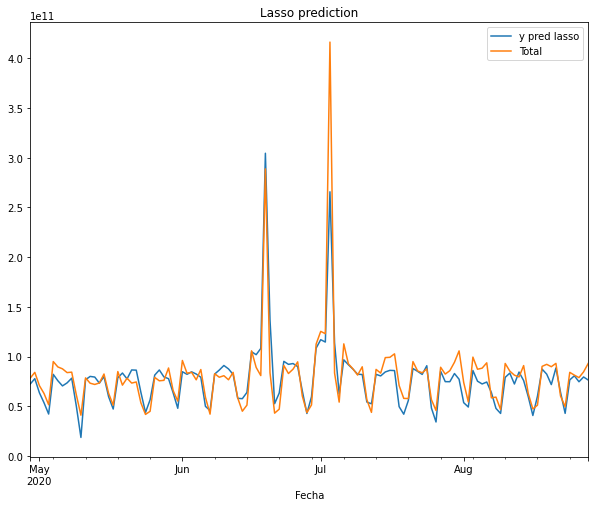

In [507]:
from matplotlib import pyplot
y_test[["y pred lasso", "Total"]].plot(figsize=(10,8), title = "Lasso prediction")

# Regresión de ElasticNet

In [508]:
model_enet = ElasticNet(alpha = 0.0000000000000001)
model_enet.fit(X_train, y_train) 
pred_train_enet= model_enet.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_enet)))
print(r2_score(y_train, pred_train_enet))

pred_test_enet= model_enet.predict(X_test)
del y_test["y pred lasso"]
print(np.sqrt(mean_squared_error(y_test,pred_test_enet)))
print(r2_score(y_test, pred_test_enet))
y_test["y pred ElasticNet"] = pred_test_enet

6102216148.759882
0.9207694996792632
17777332736.870502
0.8061116750504573


E:\Anaconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.011364142389018e+21, tolerance: 2.2747210000334856e+19
  model = cd_fast.enet_coordinate_descent(
<ipython-input-508-0ccbb62ff0aa>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test["y pred ElasticNet"] = pred_test_enet


In [509]:
from matplotlib import pyplot
y_test[["y_pred_ElasticNet", "Total"]].plot(figsize=(10,8), title = "ElasticNet prediction")

KeyError: "['y_pred_ElasticNet'] not in index"

In [510]:
y_test["y pred Ridge"] = pred_test_r
y_test["y pred lasso"] = pred_test_lasso
y_test.head()

<ipython-input-510-a309a9e83a70>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test["y pred Ridge"] = pred_test_r
<ipython-input-510-a309a9e83a70>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test["y pred lasso"] = pred_test_lasso


,Total,y pred ElasticNet,y pred Ridge,y pred lasso
Fecha,,,,
2020-04-29,7.829885e+10,7.233131e+10,7.233131e+10,7.233131e+10
2020-04-30,8.410474e+10,7.778104e+10,7.778104e+10,7.778104e+10
2020-05-01,7.071473e+10,6.350929e+10,6.350929e+10,6.350929e+10
2020-05-02,6.284436e+10,5.348697e+10,5.348697e+10,5.348697e+10
2020-05-03,5.152390e+10,4.219269e+10,4.219269e+10,4.219269e+10


# Guardando predicciones

In [513]:
import openpyxl
from openpyxl import load_workbook

In [515]:
book = load_workbook('Predicciones.xlsx')
writer = pd.ExcelWriter('Predicciones.xlsx', engine = 'openpyxl')
writer.book = book
y_test.to_excel(writer, sheet_name = "Pred", index = True)
writer.save()